# 1. Anagrafica

First plot to show the population sample with pie chart, population dynamics, etc..

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [3]:
# Load data
df = pd.read_csv("./data/DF.csv", sep=';')
column_mapping = pd.read_excel("./data/Column_mapping.xlsx")
column_dict = dict(zip(column_mapping["Code"], column_mapping["Description"]))

In [ ]:
# Drop duplicate IDs
df = df.drop_duplicates(subset="ID")

## 1.1. Anagrafica base

In [4]:
# Define target columns (remove G6)
target_columns = ["G1", "cleta", "Area", "ampiezzaclasse", "G5", "G7"]

# Define color palette
colors = sns.color_palette("pastel")

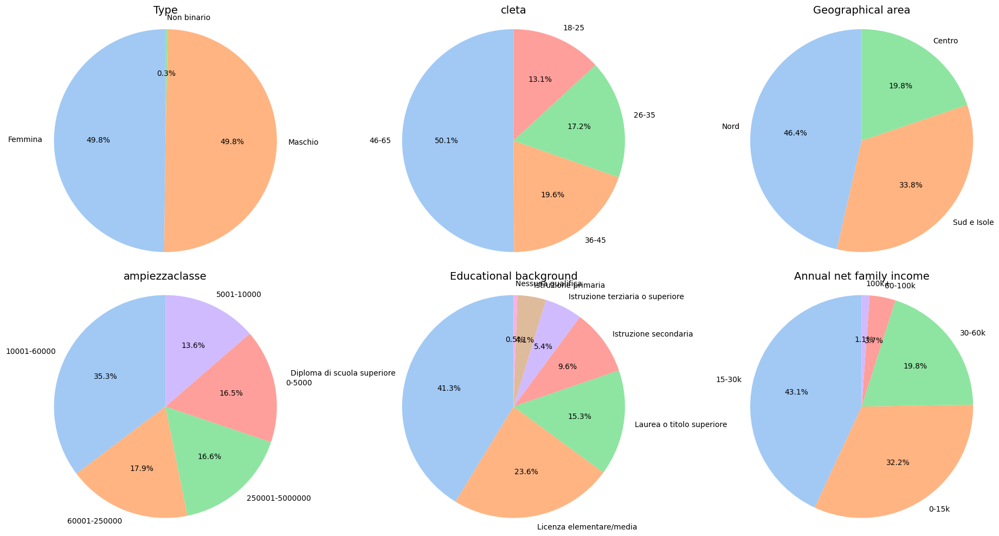

In [5]:
# Plot pie charts
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for idx, col in enumerate(target_columns):
    if col in df.columns:
        counts = df[col].value_counts(dropna=False)
        labels = counts.index.astype(str)
        values = counts.values
        title = column_dict.get(col, col)

        wedges, texts, autotexts = axes[idx].pie(
            values, labels=labels, autopct='%1.1f%%',
            startangle=90, colors=colors,
            textprops={'fontsize': 10}, labeldistance=1.1
        )
        axes[idx].axis('equal')
        axes[idx].set_title(f"{title}", fontsize=14)

# Remove unused axes
for j in range(len(target_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### 1.1.1. Gender and Age

In [8]:
# Convert G2 (age) to numeric
df["G2"] = pd.to_numeric(df["G2"], errors='coerce')

In [21]:
# Create 5-year age groups
bins = list(range(0, 101, 5))
labels = [f"{i}-{i+4}" for i in bins[:-1]]
df["AgeGroup"] = pd.cut(df["G2"], bins=bins, labels=labels, right=False)

# Count occurrences by gender and age group
pyramid_counts = df.groupby(["AgeGroup", "G1"], observed=True).size().unstack().fillna(0)

# Calculate total population with known gender and age
total_population = pyramid_counts.sum().sum()

# Convert to percentages
pyramid_percent = pyramid_counts.div(total_population).mul(100)

# Rename columns
pyramid_percent = pyramid_percent.rename(columns={"Maschio": "Male", "Femmina": "Female"}).fillna(0)

# Filter out age groups where both genders are 0%
non_zero_mask = (pyramid_percent["Male"] > 0) | (pyramid_percent["Female"] > 0)
filtered_pyramid = pyramid_percent[non_zero_mask]



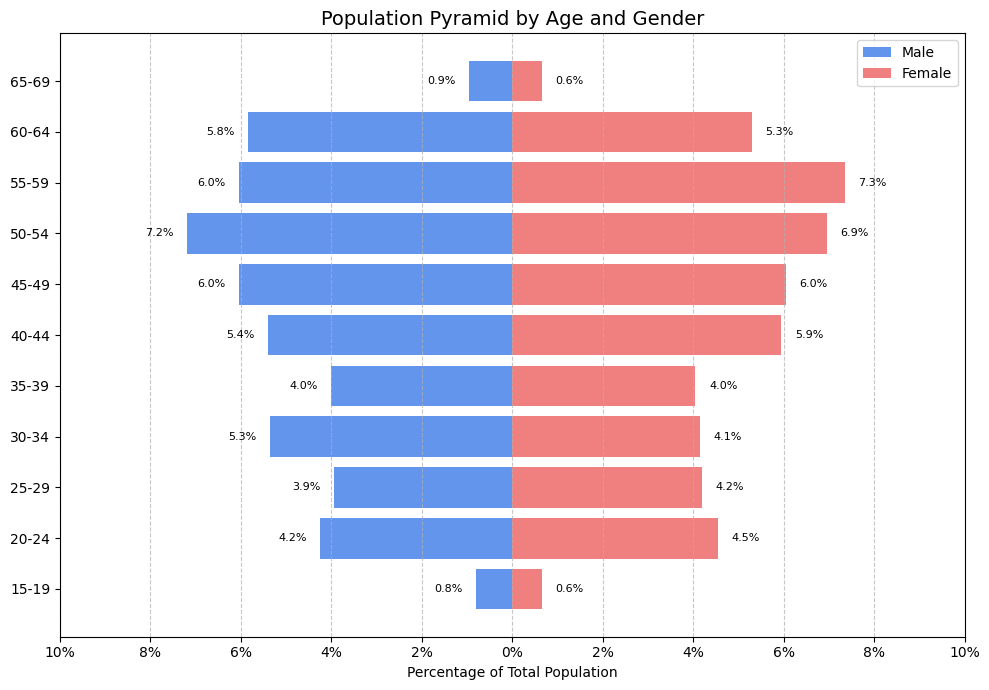

In [20]:
# Plot
fig, ax = plt.subplots(figsize=(10, 7))
y = np.arange(len(filtered_pyramid))

# Plot bars
male_vals = -filtered_pyramid["Male"]
female_vals = filtered_pyramid["Female"]
ax.barh(y, male_vals, color='cornflowerblue', label='Male')
ax.barh(y, female_vals, color='lightcoral', label='Female')

# Add value labels
for i in y:
    ax.text(male_vals.iloc[i] - 0.3, i, f'{abs(male_vals.iloc[i]):.1f}%', va='center', ha='right', fontsize=8)
    ax.text(female_vals.iloc[i] + 0.3, i, f'{female_vals.iloc[i]:.1f}%', va='center', ha='left', fontsize=8)

# Axis formatting
ax.set_yticks(y)
ax.set_yticklabels(filtered_pyramid.index)
ax.set_xticks(np.arange(-10, 11, 2))
ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-10, 11, 2)])
ax.set_xlim(-10, 10)
ax.set_xlabel("Percentage of Total Population")
ax.set_title("Population Pyramid by Age and Gender", fontsize=14)
ax.legend(loc='upper right')
ax.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

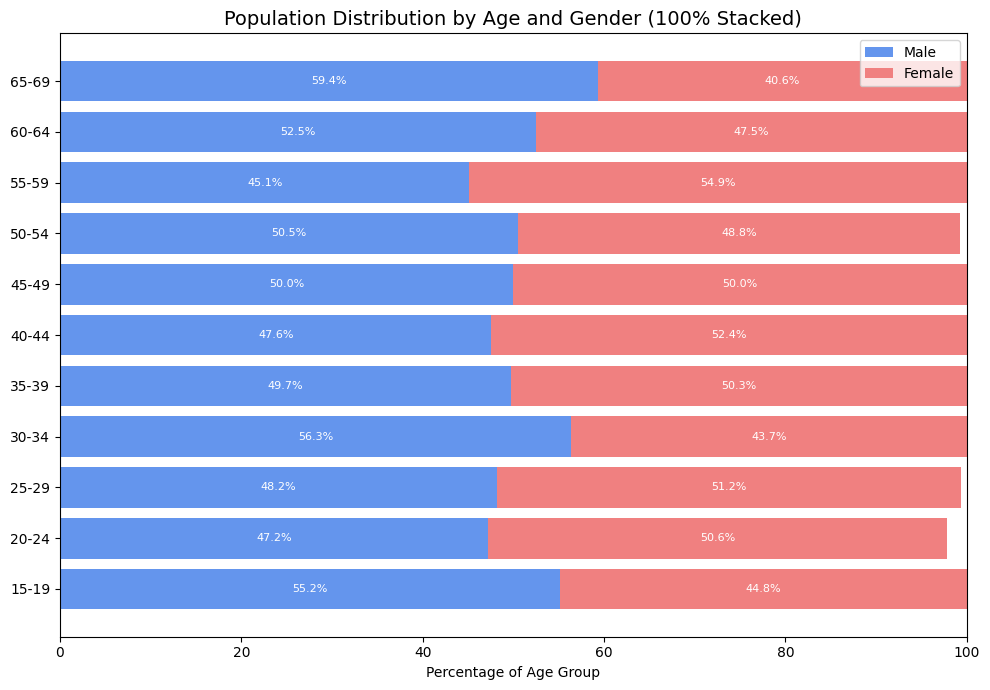

In [17]:
# Prepare data for 100% stacked horizontal bar chart

# Recalculate percentage based on total population (not just non-zero rows)
total_population = df["G2"].notna().sum()
pyramid_counts = df.groupby(["AgeGroup", "G1"], observed=True).size().unstack().fillna(0)
pyramid_percent = pyramid_counts.div(pyramid_counts.sum(axis=1), axis=0).fillna(0) * 100
pyramid_percent = pyramid_percent.rename(columns={"Maschio": "Male", "Femmina": "Female"})

# Filter out zero rows
non_zero_mask = (pyramid_percent["Male"] > 0) | (pyramid_percent["Female"] > 0)
filtered_stacked = pyramid_percent[non_zero_mask]

# Plot horizontal 100% stacked bar chart
fig, ax = plt.subplots(figsize=(10, 7))
bottom = np.zeros(len(filtered_stacked))

for gender, color in zip(["Male", "Female"], ["cornflowerblue", "lightcoral"]):
    ax.barh(filtered_stacked.index, filtered_stacked[gender], left=bottom, label=gender, color=color)
    bottom += filtered_stacked[gender].values

# Add percentage labels
for i, age in enumerate(filtered_stacked.index):
    x_male = filtered_stacked.loc[age, "Male"] / 2
    x_female = filtered_stacked.loc[age, "Male"] + filtered_stacked.loc[age, "Female"] / 2
    if filtered_stacked.loc[age, "Male"] > 3:
        ax.text(x_male, i, f'{filtered_stacked.loc[age, "Male"]:.1f}%', va='center', ha='center', fontsize=8, color='white')
    if filtered_stacked.loc[age, "Female"] > 3:
        ax.text(x_female, i, f'{filtered_stacked.loc[age, "Female"]:.1f}%', va='center', ha='center', fontsize=8, color='white')

# Format plot
ax.set_xlim(0, 100)
ax.set_xlabel("Percentage of Age Group")
ax.set_title("Population Distribution by Age and Gender (100% Stacked)", fontsize=14)
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

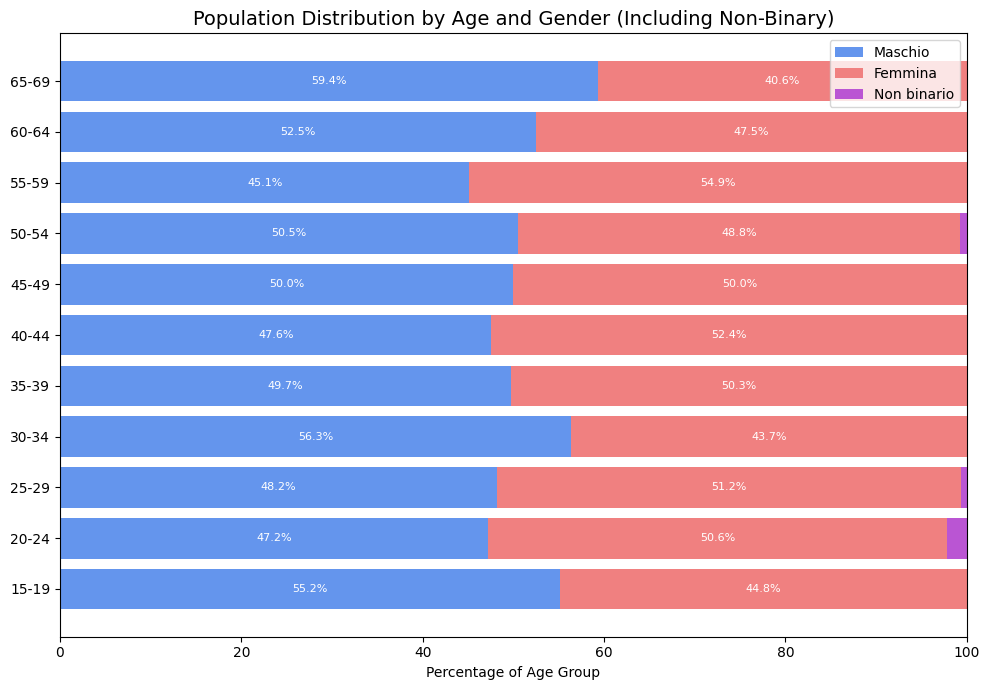

In [22]:
# Recalculate including 'Non binario'
# Load fresh counts including all genders
pyramid_counts_all = df.groupby(["AgeGroup", "G1"], observed=True).size().unstack().fillna(0)

# Compute within-age-group percentage
pyramid_percent_all = pyramid_counts_all.div(pyramid_counts_all.sum(axis=1), axis=0).fillna(0) * 100

# Filter only non-zero age groups
non_zero_mask_all = pyramid_percent_all.sum(axis=1) > 0
filtered_stacked_all = pyramid_percent_all[non_zero_mask_all]

# Define consistent gender order and colors
gender_order = ["Maschio", "Femmina", "Non binario"]
colors = {
    "Maschio": "cornflowerblue",
    "Femmina": "lightcoral",
    "Non binario": "mediumorchid"
}

# Plot horizontal 100% stacked bar chart including 'Non binario'
fig, ax = plt.subplots(figsize=(10, 7))
bottom = np.zeros(len(filtered_stacked_all))

for gender in gender_order:
    if gender in filtered_stacked_all.columns:
        values = filtered_stacked_all[gender]
        ax.barh(filtered_stacked_all.index, values, left=bottom, label=gender, color=colors[gender])
        # Add value labels
        for i, age in enumerate(filtered_stacked_all.index):
            if values.iloc[i] > 3:
                ax.text(bottom[i] + values.iloc[i] / 2, i, f'{values.iloc[i]:.1f}%', va='center', ha='center', fontsize=8, color='white')
        bottom += values.values

# Format plot
ax.set_xlim(0, 100)
ax.set_xlabel("Percentage of Age Group")
ax.set_title("Population Distribution by Age and Gender (Including Non-Binary)", fontsize=14)
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

### 1.1.2. By Region, Income and education

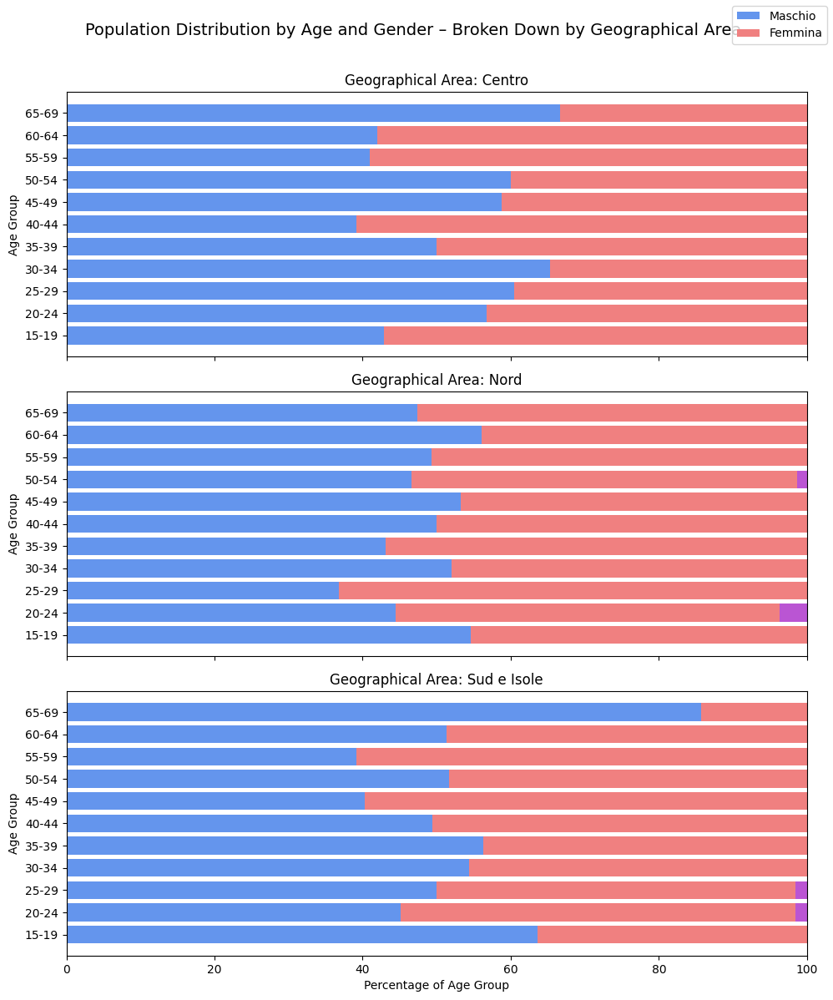

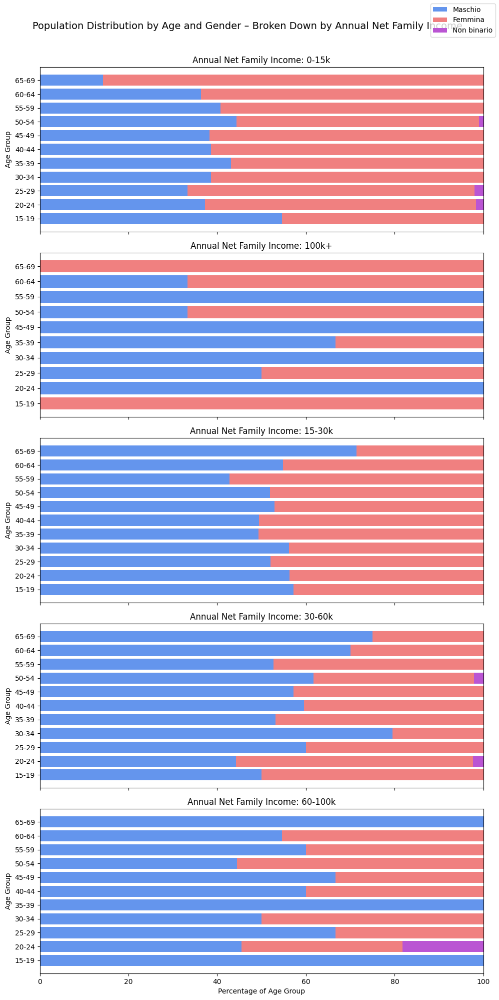

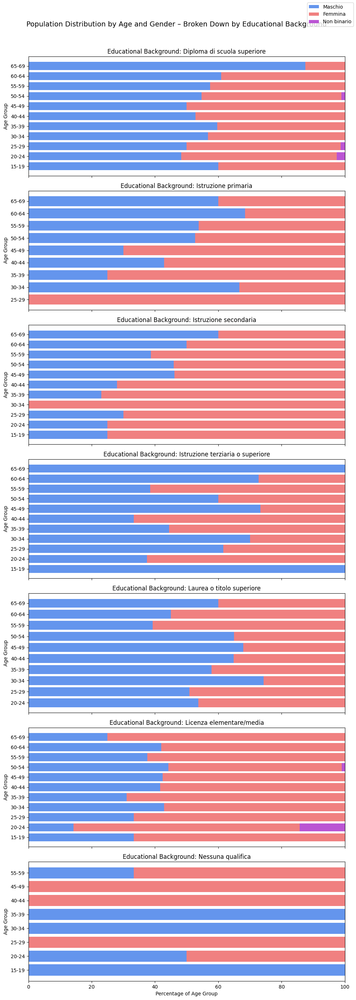

In [23]:
import matplotlib.pyplot as plt

# Define breakdown categories
breakdowns = {
    "Area": "Geographical Area",
    "G7": "Annual Net Family Income",
    "G5": "Educational Background"
}

# Store results
figures = {}

# Loop through each breakdown category
for col, col_label in breakdowns.items():
    if col not in df.columns:
        continue

    # Create subplot
    unique_groups = df[col].dropna().unique()
    n_groups = len(unique_groups)
    fig, axes = plt.subplots(nrows=n_groups, figsize=(10, 4 * n_groups), sharex=True)
    if n_groups == 1:
        axes = [axes]

    # Loop through each region/income/education group
    for i, group_value in enumerate(sorted(unique_groups)):
        subset = df[df[col] == group_value]
        pyramid_counts_group = subset.groupby(["AgeGroup", "G1"], observed=True).size().unstack().fillna(0)
        pyramid_percent_group = pyramid_counts_group.div(pyramid_counts_group.sum(axis=1), axis=0).fillna(0) * 100

        # Filter out empty age groups
        non_zero_mask = pyramid_percent_group.sum(axis=1) > 0
        filtered = pyramid_percent_group[non_zero_mask]

        # Standardize order and colors
        genders = ["Maschio", "Femmina", "Non binario"]
        colors = {"Maschio": "cornflowerblue", "Femmina": "lightcoral", "Non binario": "mediumorchid"}
        bottom = [0] * len(filtered)

        for gender in genders:
            if gender in filtered.columns:
                values = filtered[gender]
                axes[i].barh(filtered.index, values, left=bottom, label=gender if i == 0 else "", color=colors[gender])
                bottom = [a + b for a, b in zip(bottom, values)]

        axes[i].set_title(f"{col_label}: {group_value}", fontsize=12)
        axes[i].set_xlim(0, 100)
        axes[i].set_ylabel("Age Group")

    axes[-1].set_xlabel("Percentage of Age Group")
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    fig.suptitle(f"Population Distribution by Age and Gender – Broken Down by {col_label}", fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.97])

    figures[col] = fig

plt.show()

# 2. Abitudini di Trasporto e Awareness

## 2.1. Abitudini di Trasporto

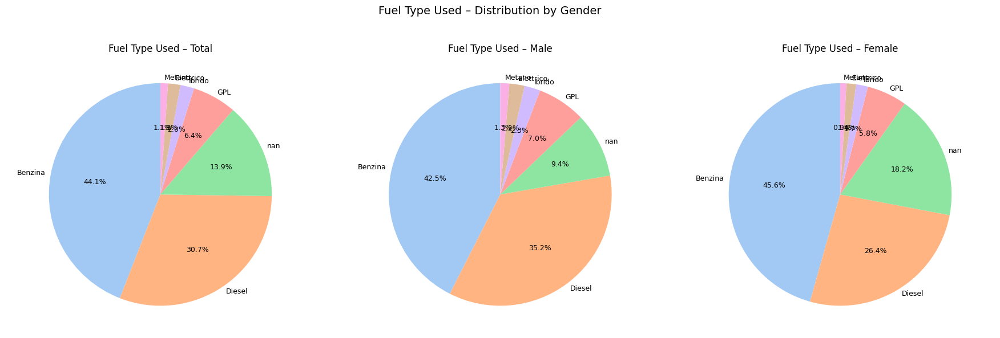

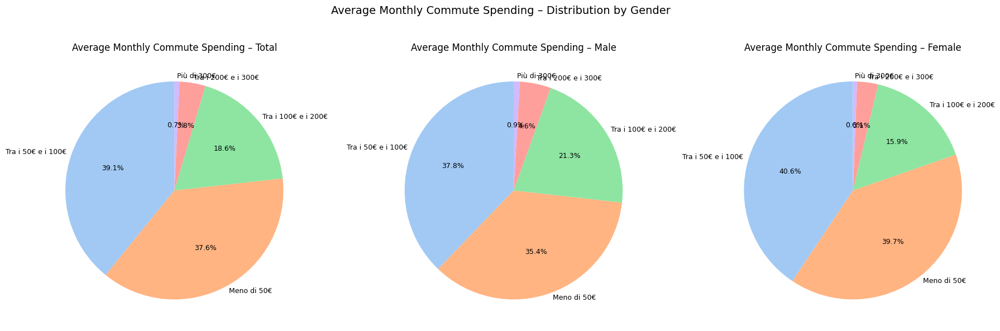

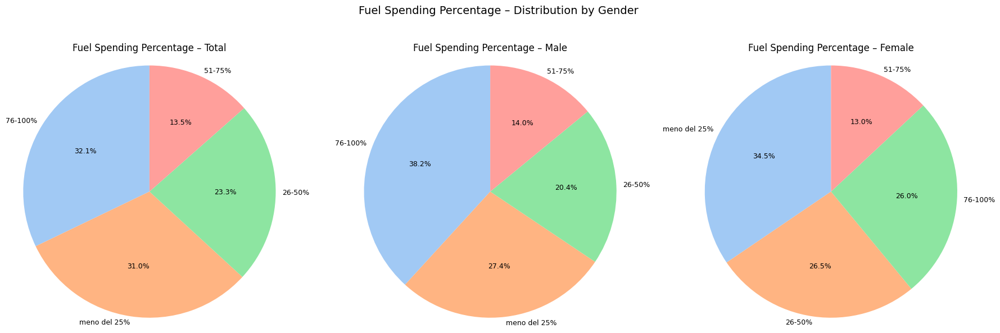

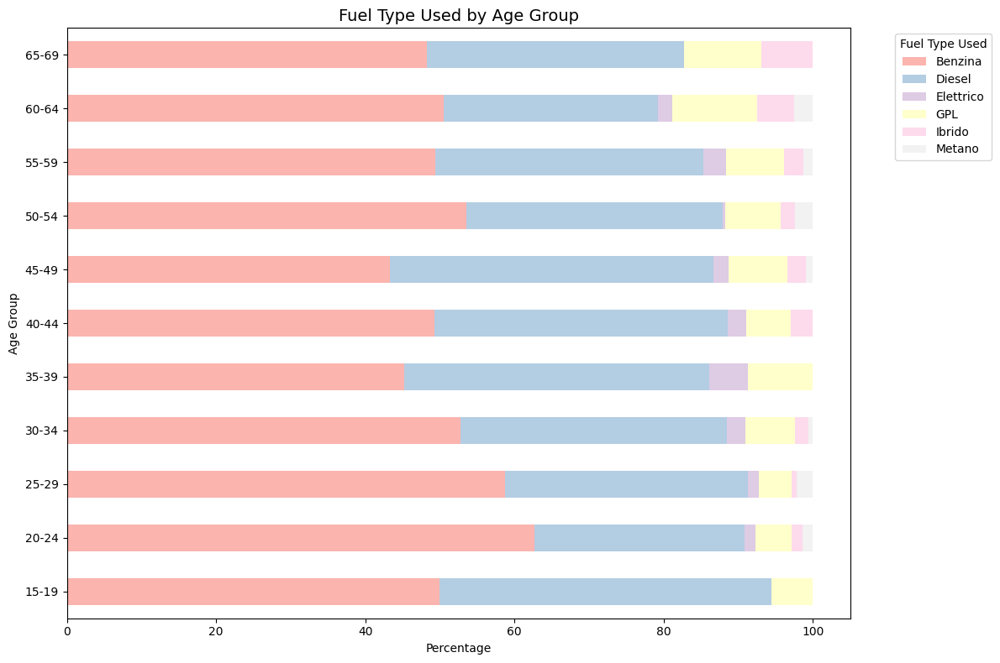

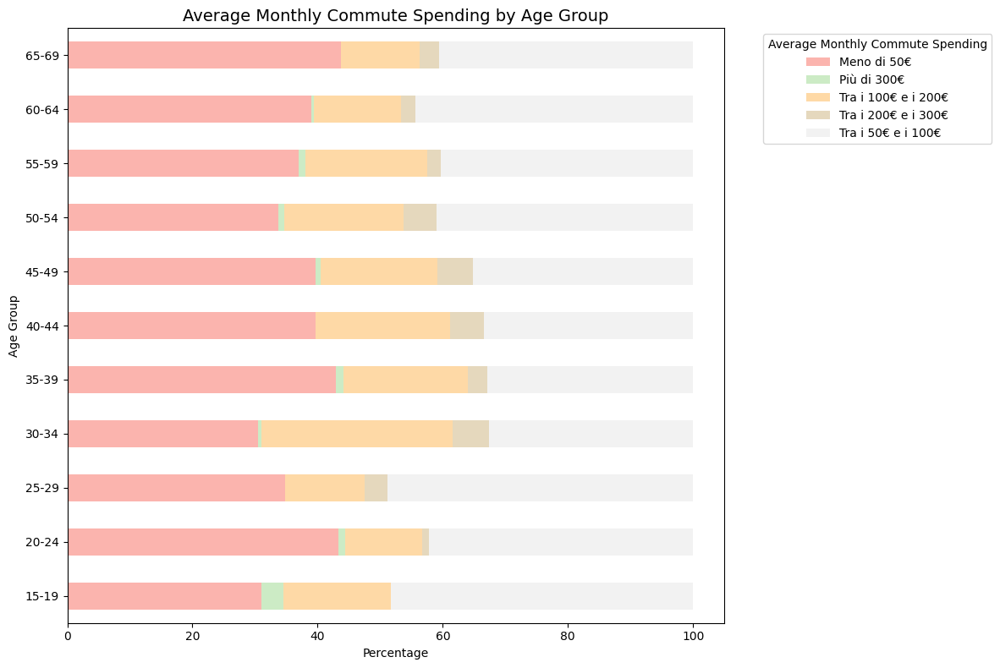

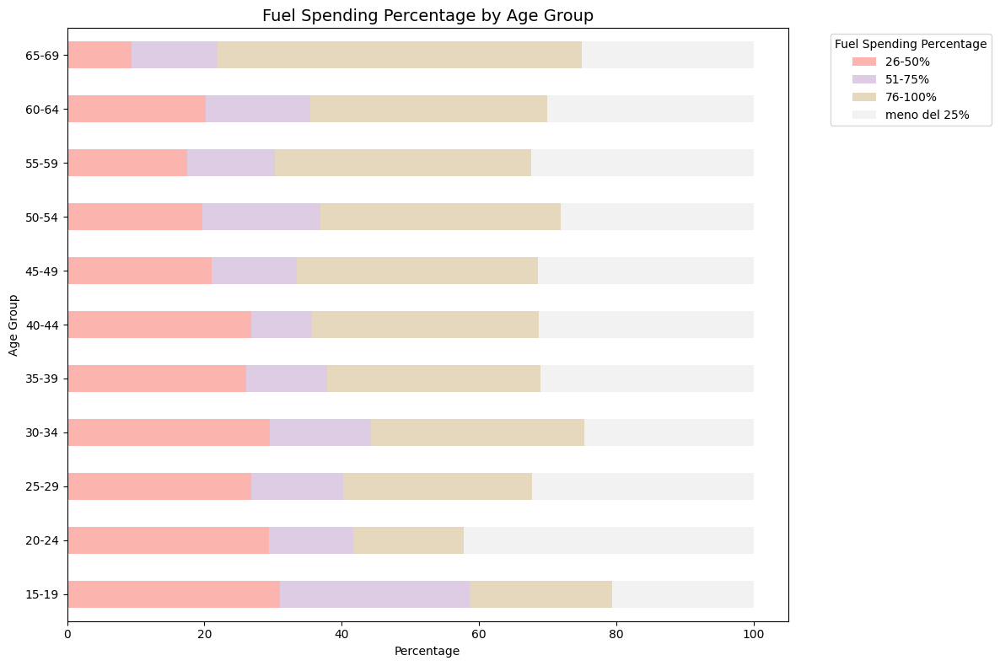

In [24]:
# Define target columns and their labels
target_cols = {
    "TA7": "Fuel Type Used",
    "TA8": "Average Monthly Commute Spending",
    "TA8bis": "Fuel Spending Percentage"
}

# Set up colors
colors = sns.color_palette("pastel")

# --- A) PIE CHARTS for total, male, and female ---
for col, label in target_cols.items():
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    gender_labels = ['Total', 'Male', 'Female']
    subsets = [df, df[df["G1"] == "Maschio"], df[df["G1"] == "Femmina"]]

    for i, subset in enumerate(subsets):
        if col in subset.columns:
            counts = subset[col].value_counts(dropna=False)
            wedges, texts, autotexts = axes[i].pie(
                counts.values,
                labels=counts.index.astype(str),
                autopct='%1.1f%%',
                startangle=90,
                colors=colors,
                textprops={'fontsize': 9},
                labeldistance=1.05
            )
            axes[i].axis('equal')
            axes[i].set_title(f"{label} – {gender_labels[i]}", fontsize=12)

    plt.suptitle(f"{label} – Distribution by Gender", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# --- B) AGE GROUP STACKED BARS for each column ---
# Reuse AgeGroup column already created
age_bins = list(range(0, 101, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df["AgeGroup"] = pd.cut(df["G2"], bins=age_bins, labels=age_labels, right=False)

for col, label in target_cols.items():
    # Group and normalize
    grouped = df.groupby(["AgeGroup", col], observed=True).size().unstack().fillna(0)
    grouped_percent = grouped.div(grouped.sum(axis=1), axis=0) * 100
    grouped_percent = grouped_percent.loc[grouped_percent.sum(axis=1) > 0]  # remove empty age groups

    # Plot
    fig, ax = plt.subplots(figsize=(12, 8))
    grouped_percent.plot(kind='barh', stacked=True, ax=ax, colormap='Pastel1')

    ax.set_title(f"{label} by Age Group", fontsize=14)
    ax.set_xlabel("Percentage")
    ax.set_ylabel("Age Group")
    ax.legend(title=label, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [29]:
# Re-import necessary libraries after reset
import pandas as pd
from scipy.stats import chi2_contingency

# Re-load data
df = pd.read_csv("./data/DF.csv", sep=';')

# Drop duplicate IDs
df = df.drop_duplicates(subset="ID")

# Define target columns
target_cols = {
    "TA7": "Fuel Type Used",
    "TA8": "Average Monthly Commute Spending",
    "TA8bis": "Fuel Spending Percentage"
}

# Run Chi-square tests for gender (G1) vs target columns
chi_results = []

for col in target_cols.keys():
    if col in df.columns:
        contingency_table = pd.crosstab(df["G1"], df[col])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        chi_results.append({
            "Column": col,
            "Chi2 Statistic": chi2,
            "p-value": p,
            "Degrees of Freedom": dof
        })

# Convert to DataFrame and display
chi_df = pd.DataFrame(chi_results)
chi_df

,Column,Chi2 Statistic,p-value,Degrees of Freedom
0,TA7,16.732284,8.050176e-02,10
1,TA8,17.073988,2.934781e-02,8
2,TA8bis,44.124095,6.984833e-08,6


Here are the results of the Chi-Square tests assessing statistical dependence between gender (G1) and the three columns:

    TA7 (Fuel Type Used) – marginally non-significant (p ≈ 0.08)

    TA8 (Commute Spending) – significant difference by gender (p ≈ 0.03)

    TA8bis (Fuel Spending Percentage) – highly significant difference (p < 0.001)

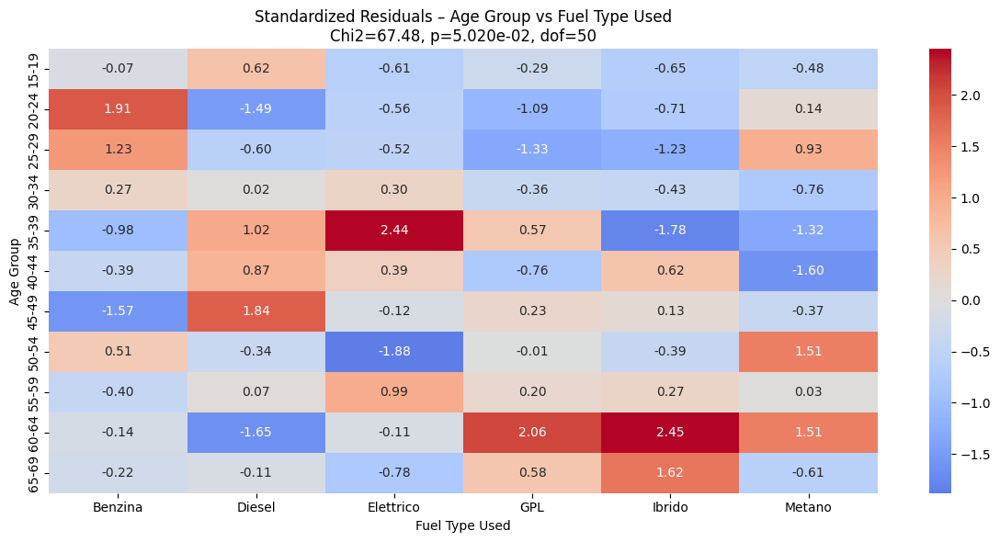

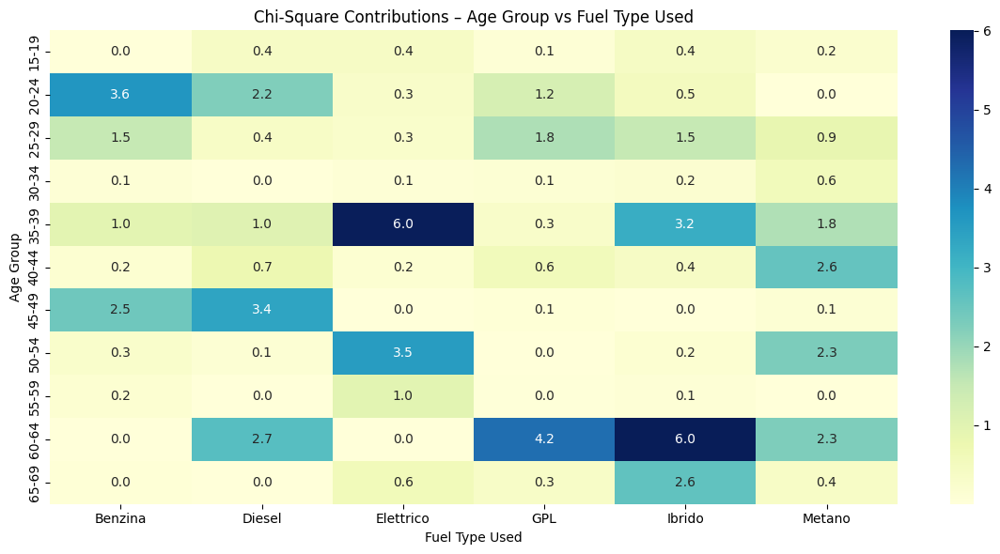

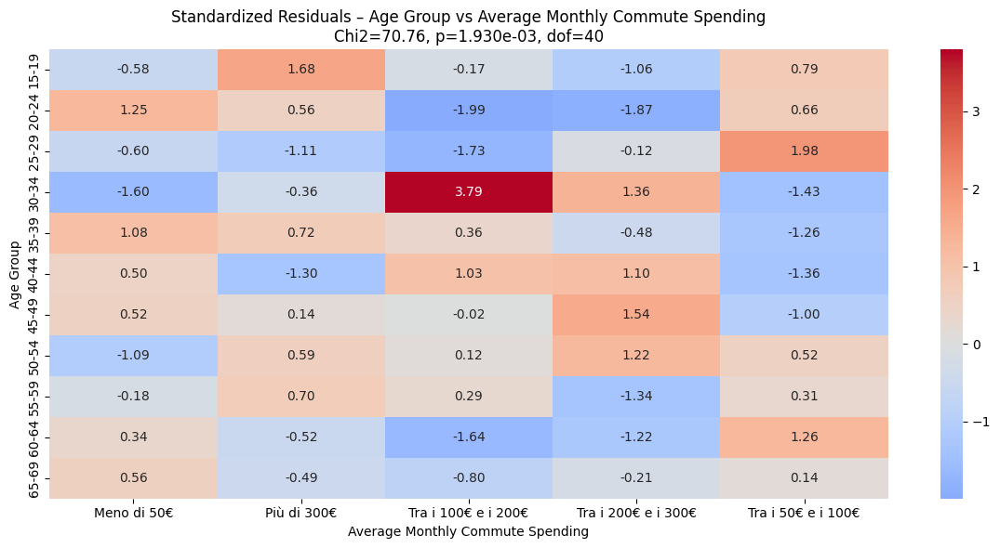

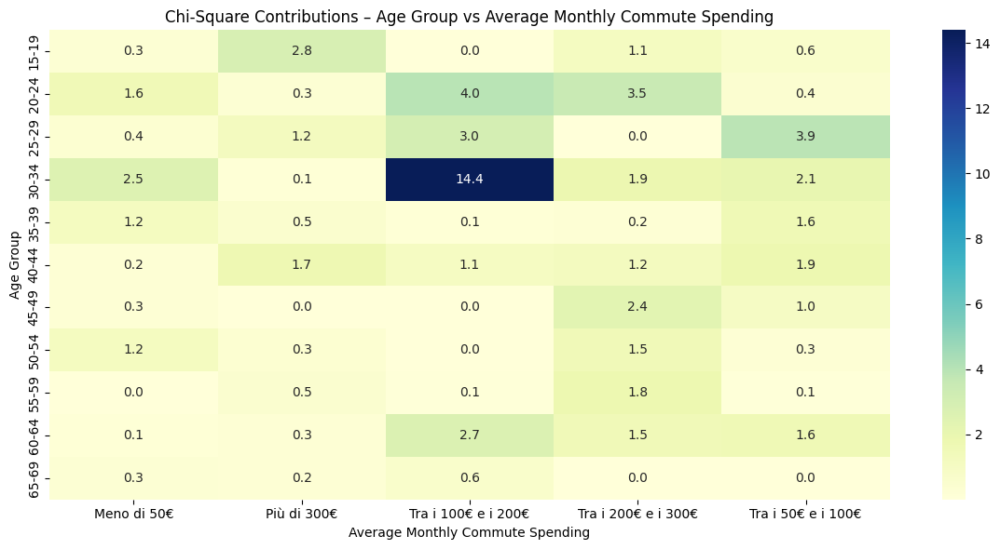

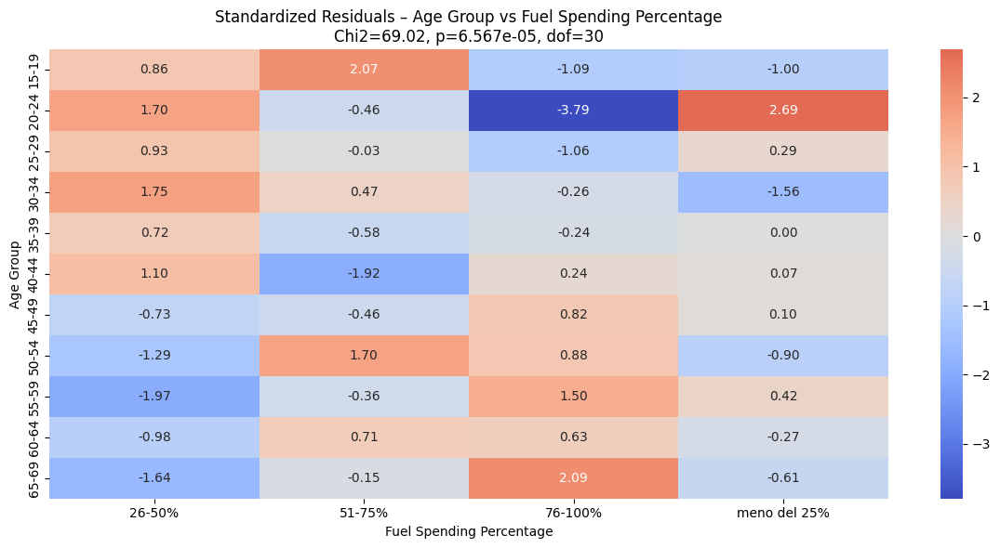

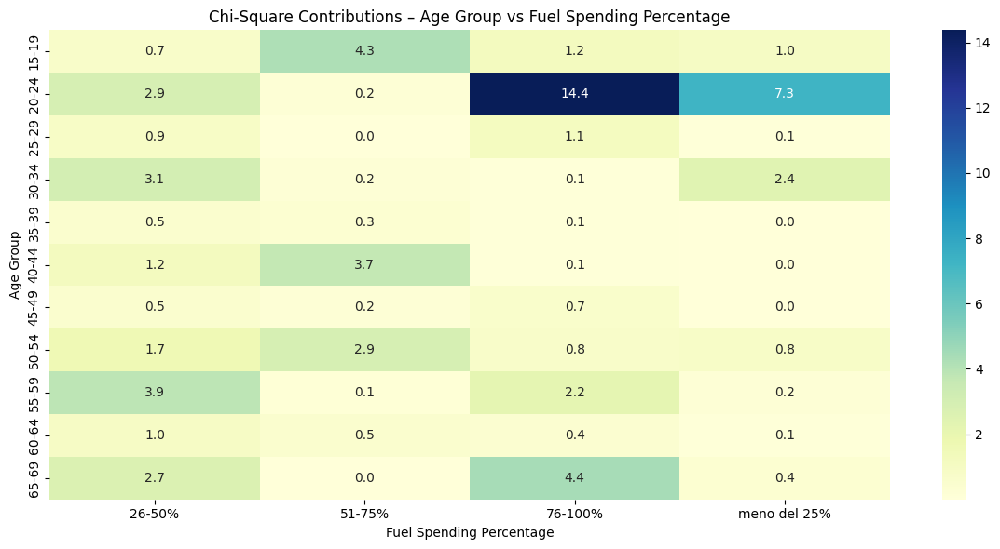

In [30]:
# Re-import libraries and load data
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Load files
df = pd.read_csv("./data/DF.csv", sep=';')
df = df.drop_duplicates(subset="ID")

# Define columns of interest
target_cols = {
    "TA7": "Fuel Type Used",
    "TA8": "Average Monthly Commute Spending",
    "TA8bis": "Fuel Spending Percentage"
}

# Create AgeGroup column
df["G2"] = pd.to_numeric(df["G2"], errors='coerce')
age_bins = list(range(0, 101, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df["AgeGroup"] = pd.cut(df["G2"], bins=age_bins, labels=age_labels, right=False)

# Run chi-square tests and plot residuals + contributions
for col, label in target_cols.items():
    if col not in df.columns:
        continue

    contingency = pd.crosstab(df["AgeGroup"], df[col])
    chi2, p, dof, expected = chi2_contingency(contingency)

    residuals = (contingency - expected) / np.sqrt(expected)
    contribution = ((contingency - expected) ** 2) / expected

    # Standardized residuals heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(residuals, annot=True, fmt=".2f", cmap="coolwarm", center=0)
    plt.title(f"Standardized Residuals – Age Group vs {label}\nChi2={chi2:.2f}, p={p:.3e}, dof={dof}")
    plt.xlabel(label)
    plt.ylabel("Age Group")
    plt.tight_layout()
    plt.show()

    # Chi-square contribution heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(contribution, annot=True, fmt=".1f", cmap="YlGnBu")
    plt.title(f"Chi-Square Contributions – Age Group vs {label}")
    plt.xlabel(label)
    plt.ylabel("Age Group")
    plt.tight_layout()
    plt.show()

TA7 – Fuel Type Used

    Residuals: Identify which age groups over/under-use specific fuel types compared to expectation.

    Contribution: Largest chi-square drivers are clearly visible — helping prioritize categories.

💸 TA8 – Average Monthly Commute Spending

    Residuals highlight which age brackets diverge from expected cost profiles.

    Contribution reveals statistically impactful age–cost combinations.

⛽ TA8bis – Fuel Spending Percentage

    Marked age-specific patterns are visible, especially in lower and higher percent categories.

## 2.1. Awareness

In [349]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import unicodedata

# Normalize text
def normalize(s):
    return unicodedata.normalize('NFKD', str(s)).encode('ascii', errors='ignore').decode('utf-8').strip().lower()

# Load data
df = pd.read_csv("./data/DF.csv", sep=";")
gdf = gpd.read_file("./data/limits_IT_regions.geojson")

# Reload Column_mapping to recover column_dict
column_map = pd.read_excel("./data/Column_mapping.xlsx")
column_dict = dict(zip(column_map["Code"], column_map["Description"]))


# Normalize region names
df["regione_norm"] = df["regione"].apply(normalize)
gdf["reg_name_norm"] = gdf["reg_name"].apply(normalize)

# Drop duplicate IDs
df = df.drop_duplicates(subset="ID")

### 2.1.1. Environmental Awareness

In [297]:
ea_columns = ["EA_1", "EA_2", "EA_3", "EA_4"]
df_ea = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_ea)
n_respondents

2001

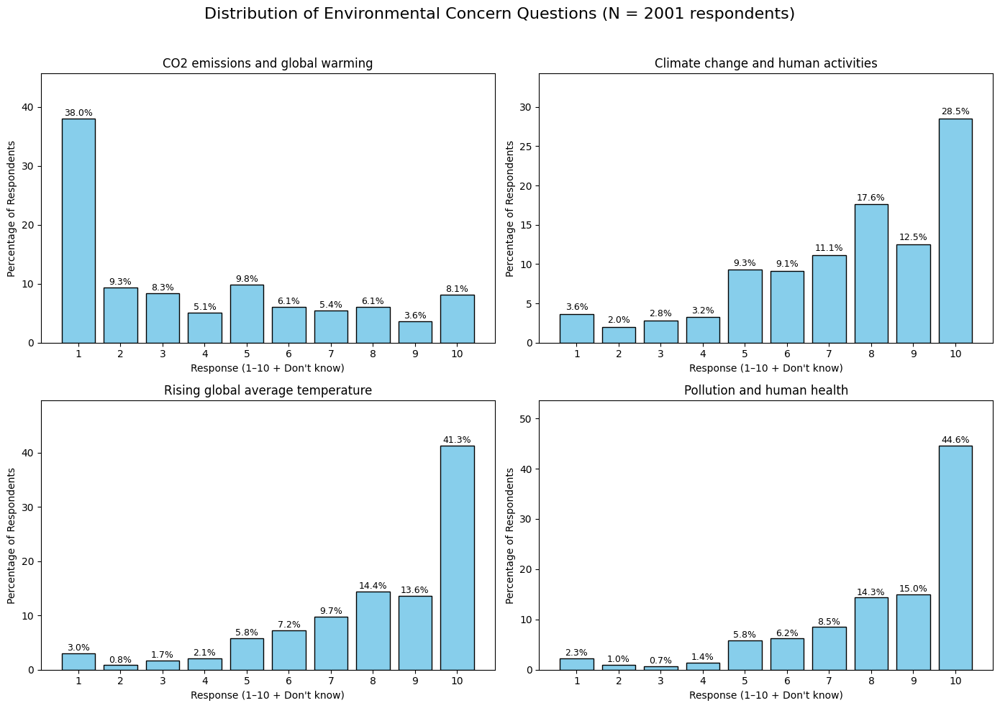

In [298]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(ea_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_ea[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)
# Global title
plt.suptitle(f"Distribution of Environmental Awareness Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [320]:
ea_columns = ["EA_1", "EA_2", "EA_3", "EA_4"]
df_ea = df.copy()

# Replace "Non so" with NaN for averaging
for col in ea_columns:
    #df_ce[col] = df_ce[col].replace("Non so", 5)
    df_ea[col] = pd.to_numeric(df_ea[col].replace("Non so", pd.NA), errors="coerce")

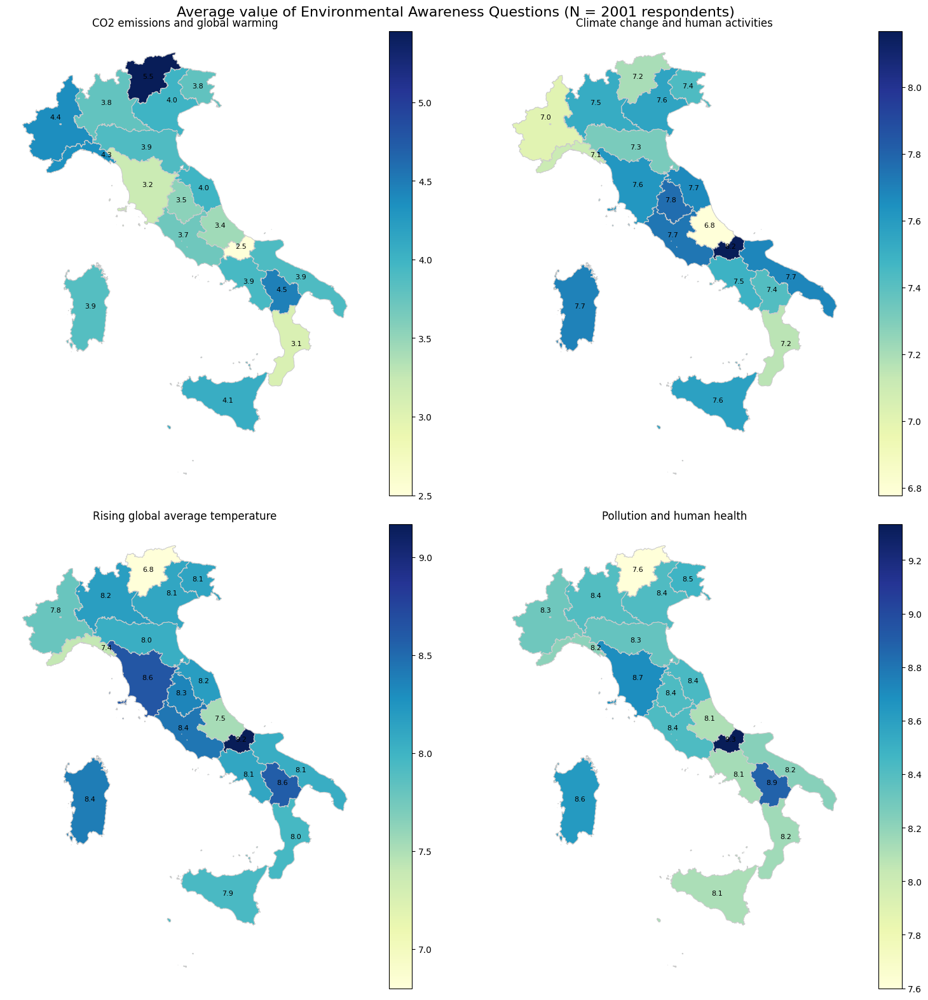

In [321]:
# Compute regional averages
region_scores = df_ea.groupby("regione_norm")[["EA_1", "EA_2", "EA_3", "EA_4"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
ea_columns = ["EA_1", "EA_2", "EA_3", "EA_4"]


for ax, col, title in zip(axes.flatten(), ea_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Environmental Awareness Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

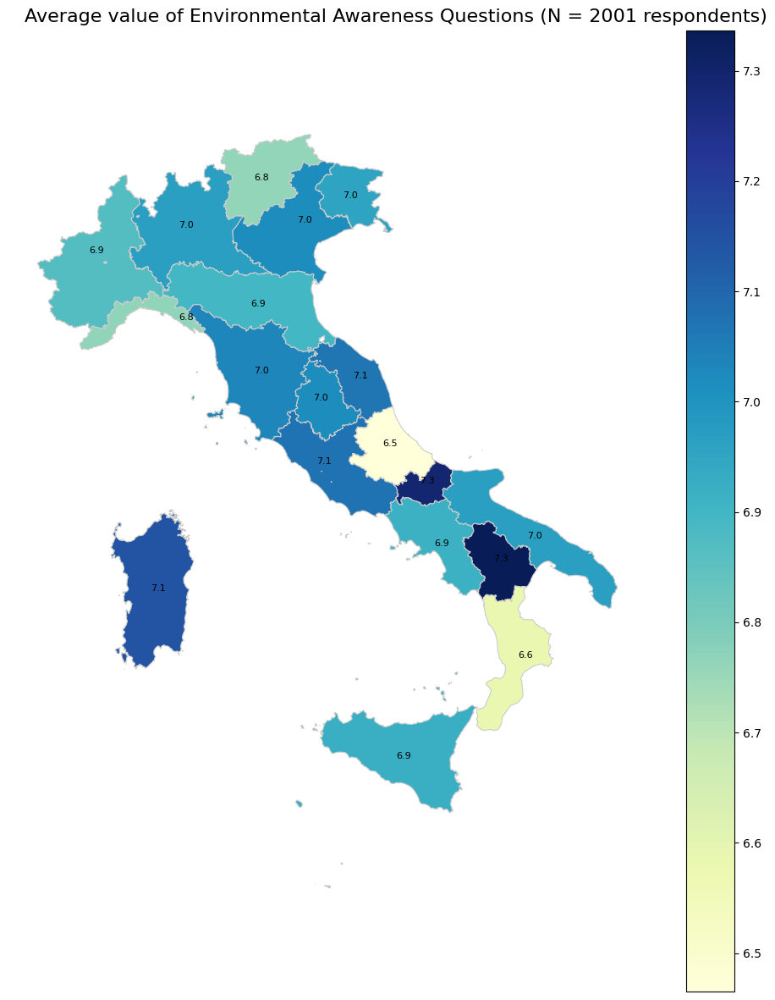

In [322]:
# Compute row-wise average of CE scores
df_ea["EA_avg"] = df_ea[ea_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_ea.groupby("regione_norm")["EA_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="EA_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['EA_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Environmental Awareness Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 2.1.2. Political View

In [326]:
pp_columns = ["PP1_1","PP2_1","PP2_2","PP2_3","PP2_4","PP2_5","PP2_6"]
df_pp = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_pp)
n_respondents

2001

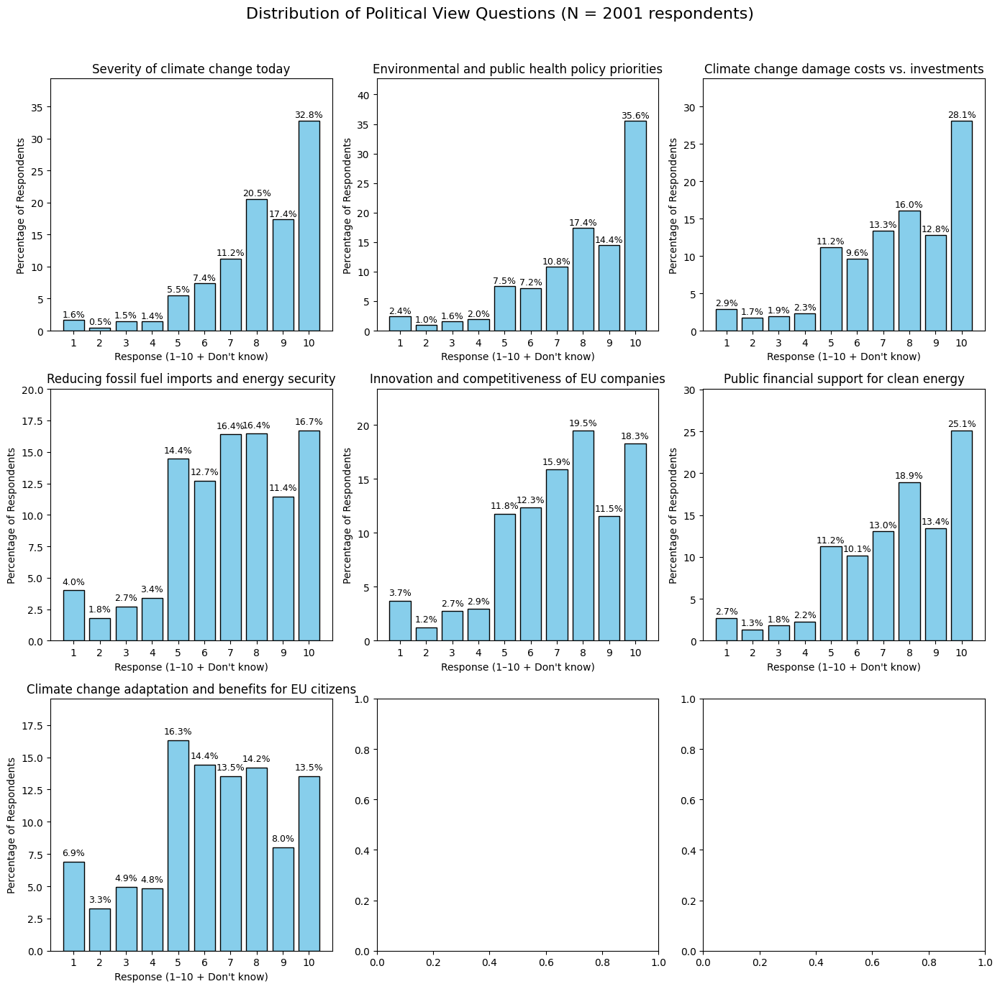

In [331]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(3, 3, figsize=(14, 14))
axes = axes.flatten()

for i, col in enumerate(pp_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_pp[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)
# Global title
plt.suptitle(f"Distribution of Political View Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
pp_columns = ["PP1_1","PP2_1","PP2_2","PP2_3","PP2_4","PP2_5","PP2_6"]
df_pp = df.copy()

# Replace "Non so" with NaN for averaging
for col in pp_columns:
    #df_ce[col] = df_ce[col].replace("Non so", 5)
    df_pp[col] = pd.to_numeric(df_pp[col].replace("Non so", pd.NA), errors="coerce")

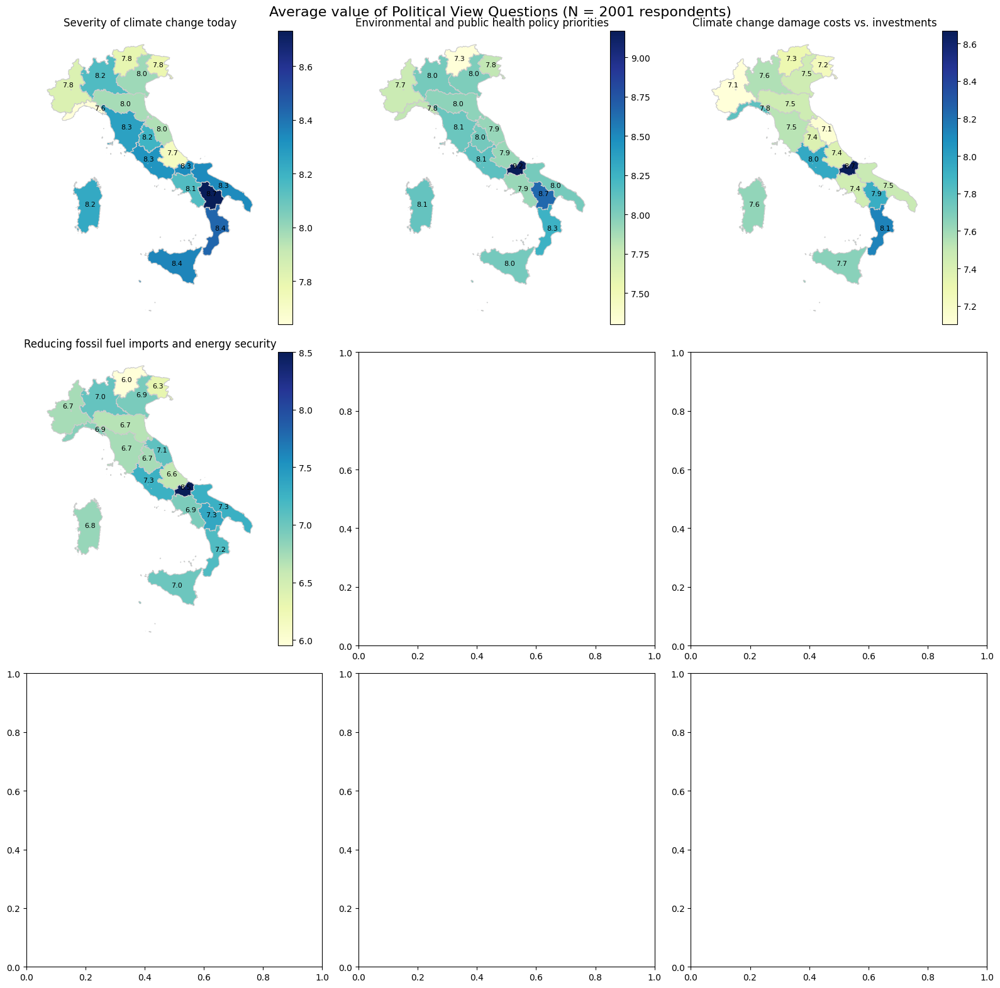

In [334]:
# Compute regional averages
region_scores = df_pp.groupby("regione_norm")[["PP1_1","PP2_1","PP2_2","PP2_3","PP2_4","PP2_5","PP2_6"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(3, 3, figsize=(16, 16))
pp_columns = ["PP1_1","PP2_1","PP2_2","PP2_3","PP2_4","PP2_5","PP2_6"]


for ax, col, title in zip(axes.flatten(), pp_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Political View Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

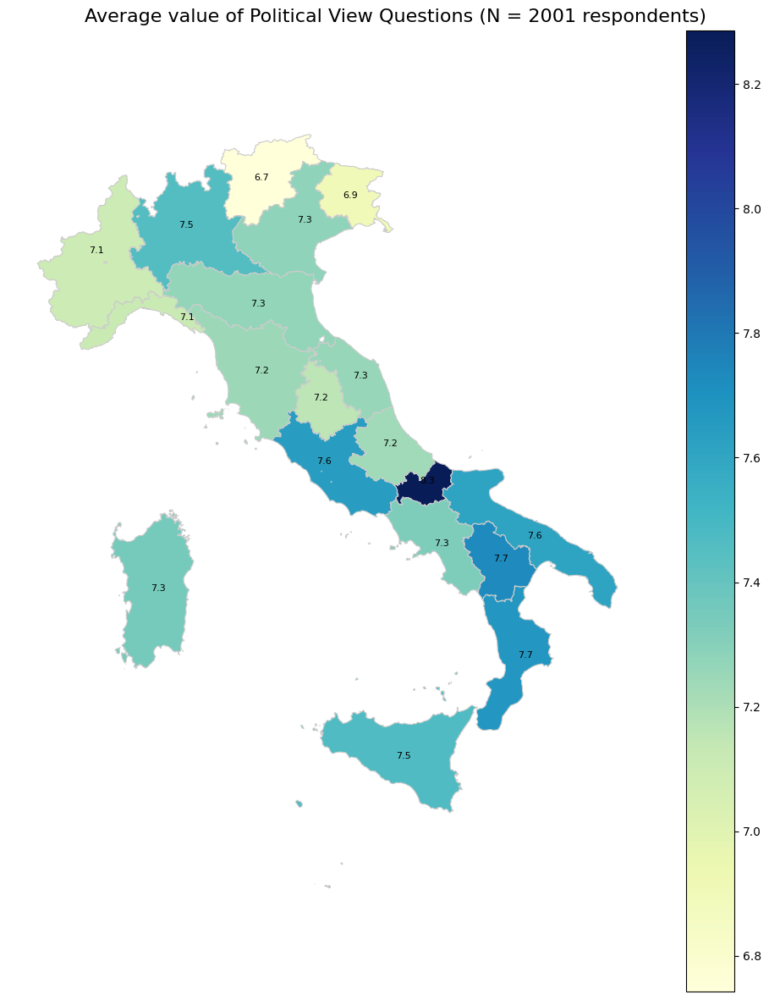

In [336]:
# Compute row-wise average of CE scores
df_pp["PP_avg"] = df_pp[pp_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_pp.groupby("regione_norm")["PP_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="PP_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['PP_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Political View Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 2.1.3. Political Trust

In [337]:
pt_columns = ["PT_1","PT_2","PT_3","PT_4"]
df_pt = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_pt)
n_respondents

2001

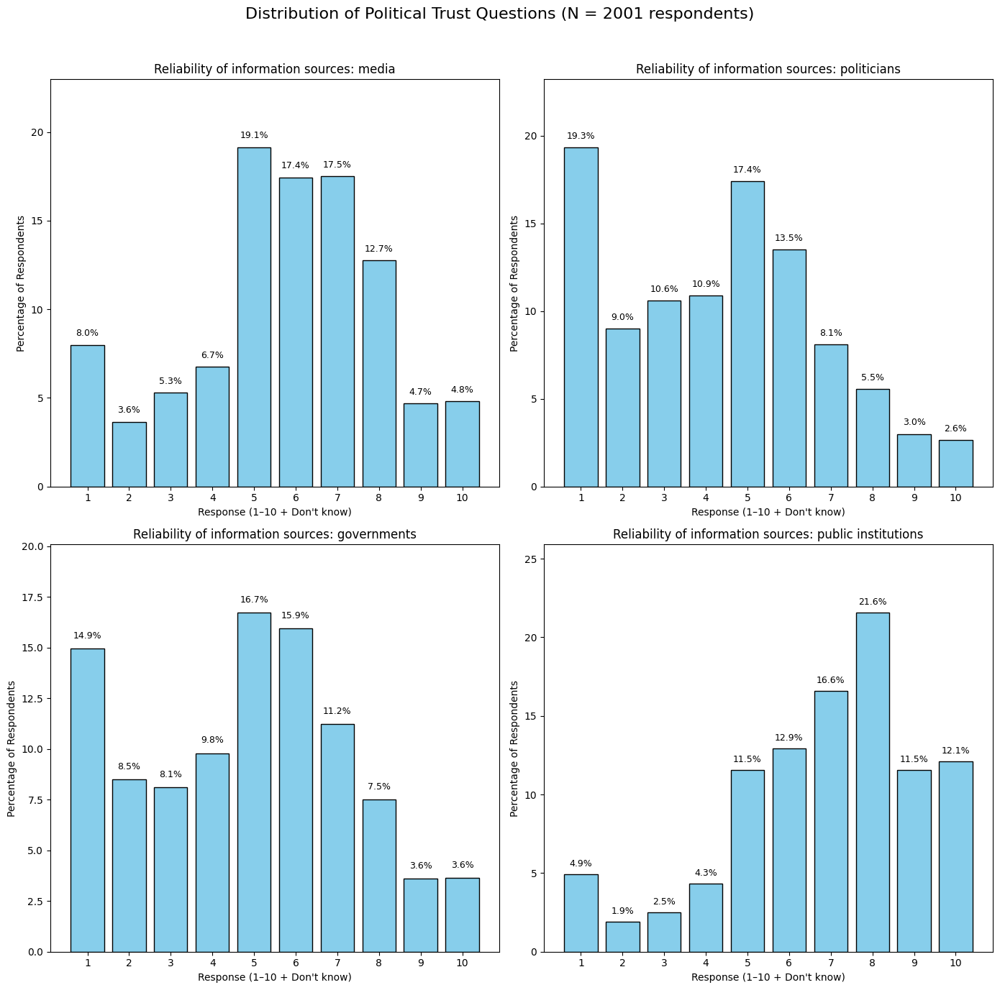

In [338]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for i, col in enumerate(pt_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_pt[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)
# Global title
plt.suptitle(f"Distribution of Political Trust Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [339]:
pt_columns = ["PT_1","PT_2","PT_3","PT_4"]
df_pt = df.copy()

# Replace "Non so" with NaN for averaging
for col in pt_columns:
    #df_ce[col] = df_ce[col].replace("Non so", 5)
    df_pt[col] = pd.to_numeric(df_pt[col].replace("Non so", pd.NA), errors="coerce")

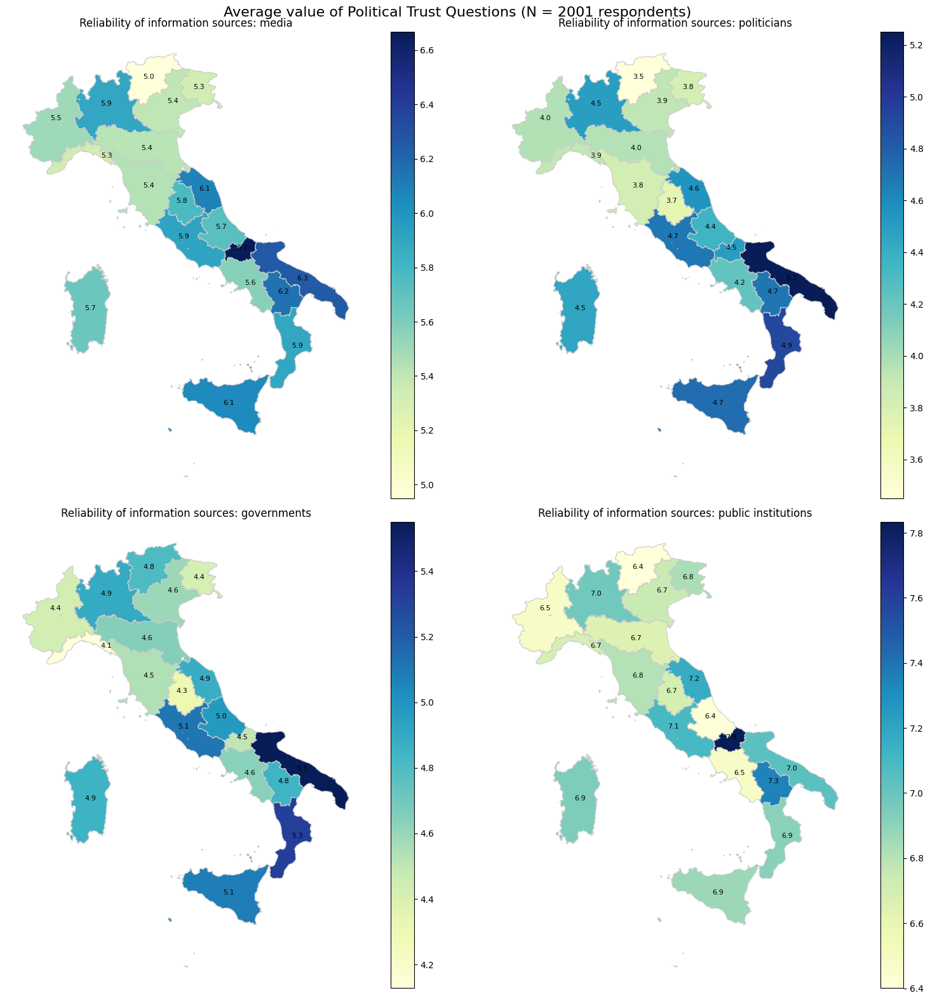

In [341]:
# Compute regional averages
region_scores = df_pt.groupby("regione_norm")[["PT_1","PT_2","PT_3","PT_4"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
pt_columns = ["PT_1","PT_2","PT_3","PT_4"]


for ax, col, title in zip(axes.flatten(), pt_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Political Trust Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

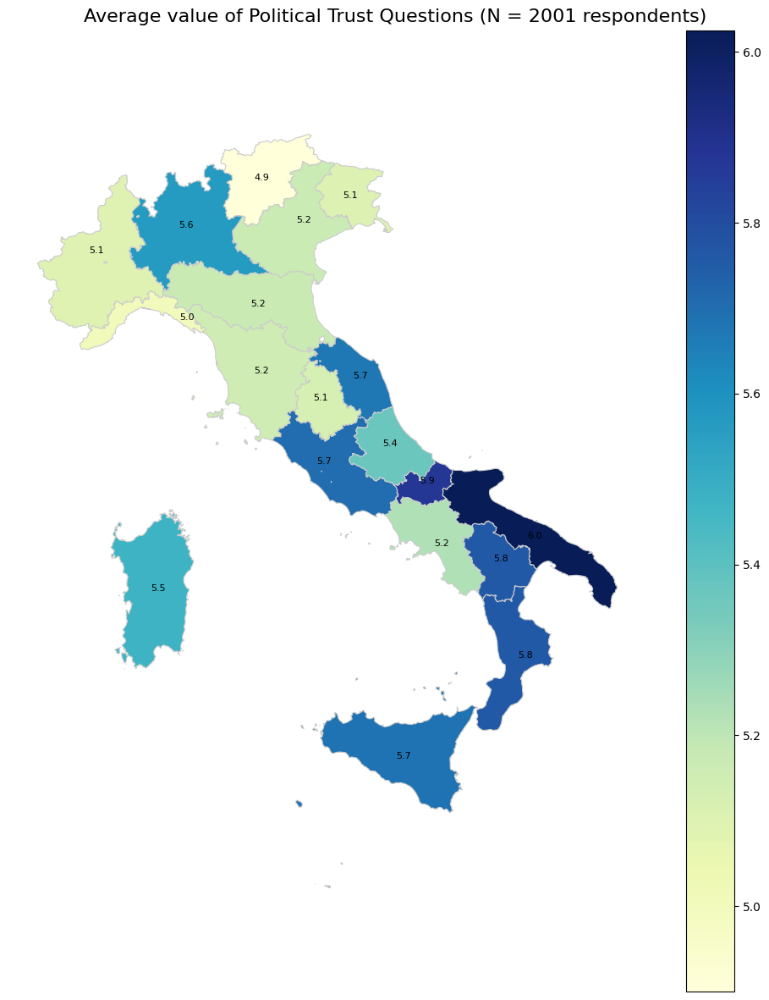

In [342]:
# Compute row-wise average of CE scores
df_pt["PT_avg"] = df_pt[pt_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_pt.groupby("regione_norm")["PT_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="PT_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['PT_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Political Trust Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 2.1.4. Environemental Actions

In [350]:
pa_columns = ["PAPA_1","PAPA_2","PAPA_3","PAPA_4","PAPA_5","PAPA_6","PAPA_7"]
df_pa = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_pa)
n_respondents

2001

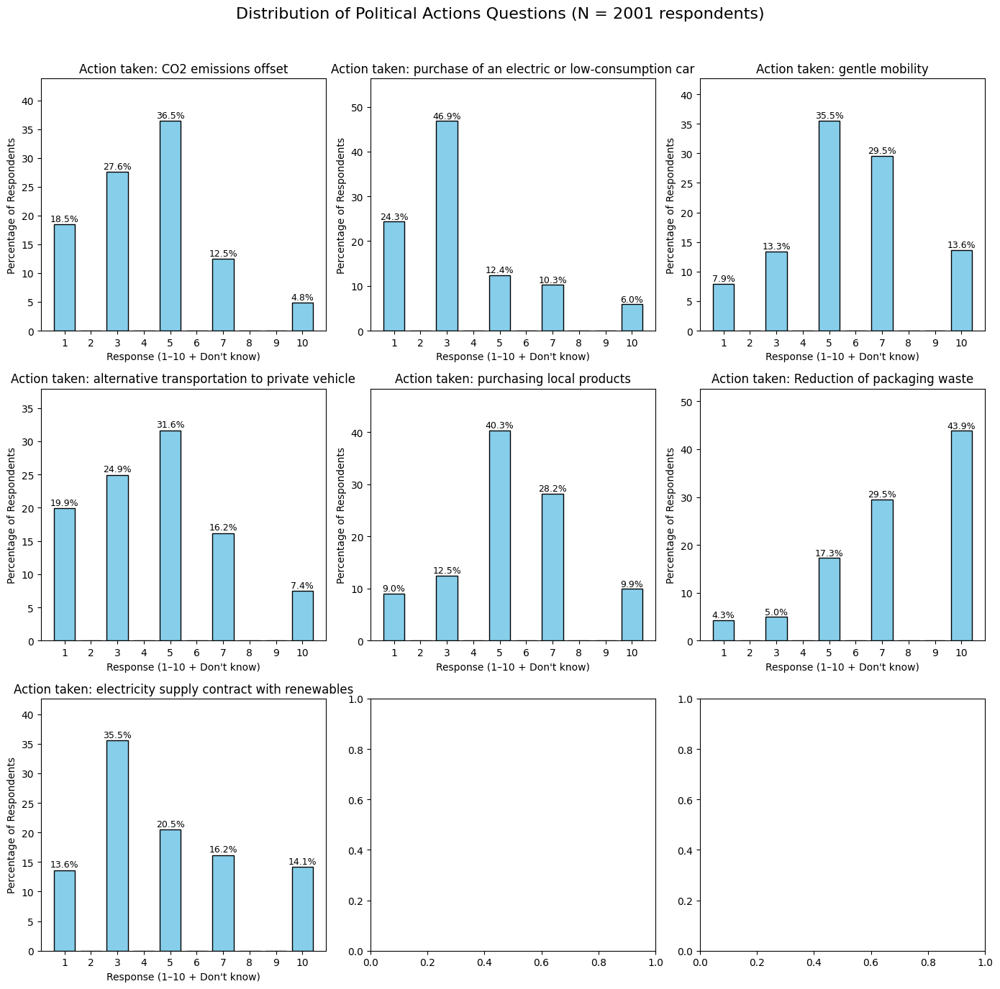

In [351]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(3, 3, figsize=(14, 14))
axes = axes.flatten()

for i, col in enumerate(pa_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_pa[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)
# Global title
plt.suptitle(f"Distribution of Political Actions Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [354]:
pa_columns = ["PAPA_1","PAPA_2","PAPA_3","PAPA_4","PAPA_5","PAPA_6","PAPA_7"]
df_pa = df.copy()

# Replace "Non so" with NaN for averaging
for col in pa_columns:
    df_pa[col] = pd.to_numeric(df_pa[col].replace("Non so", pd.NA), errors="coerce")

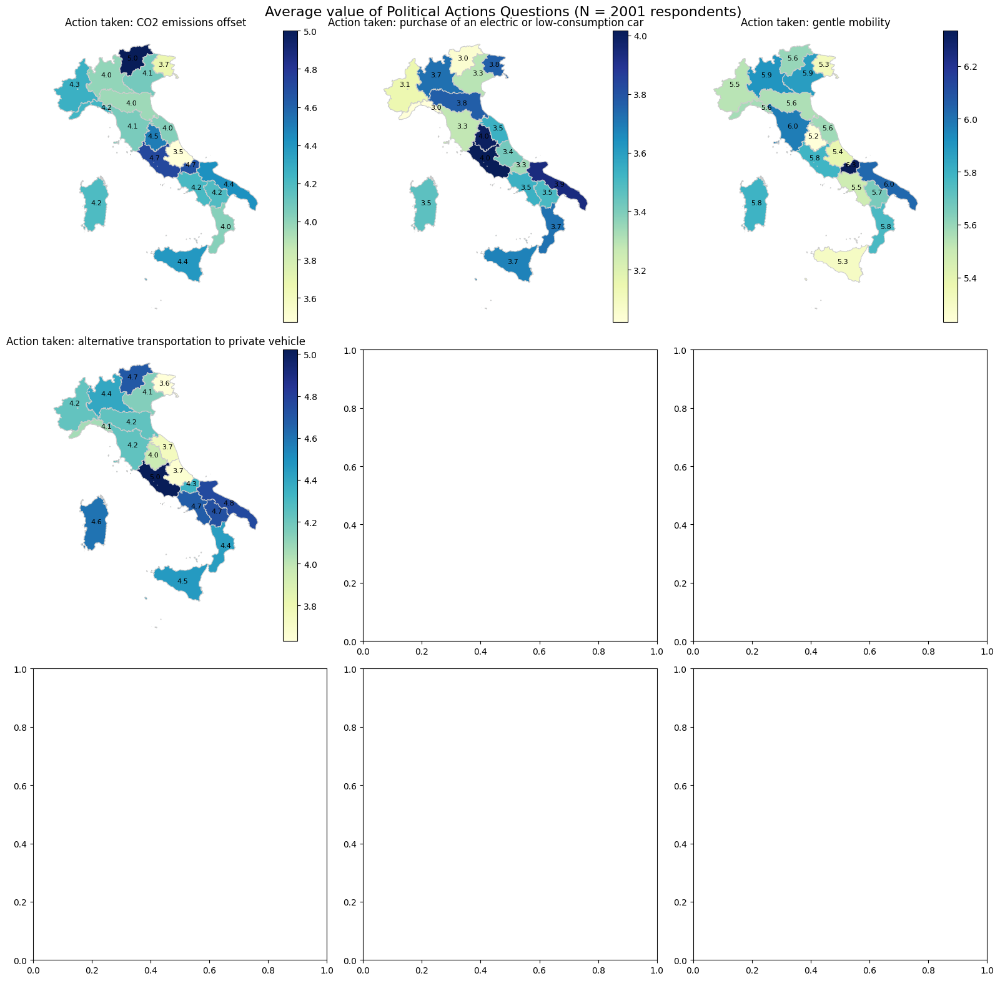

In [361]:
# Compute regional averages
region_scores = df_pa.groupby("regione_norm")[["PAPA_1","PAPA_2","PAPA_3","PAPA_4","PAPA_5","PAPA_6","PAPA_7"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(16, 16))
pa_columns = ["PAPA_1","PAPA_2","PAPA_3","PAPA_4","PAPA_5","PAPA_6","PAPA_7"]


for ax, col, title in zip(axes.flatten(), pa_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Political Actions Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

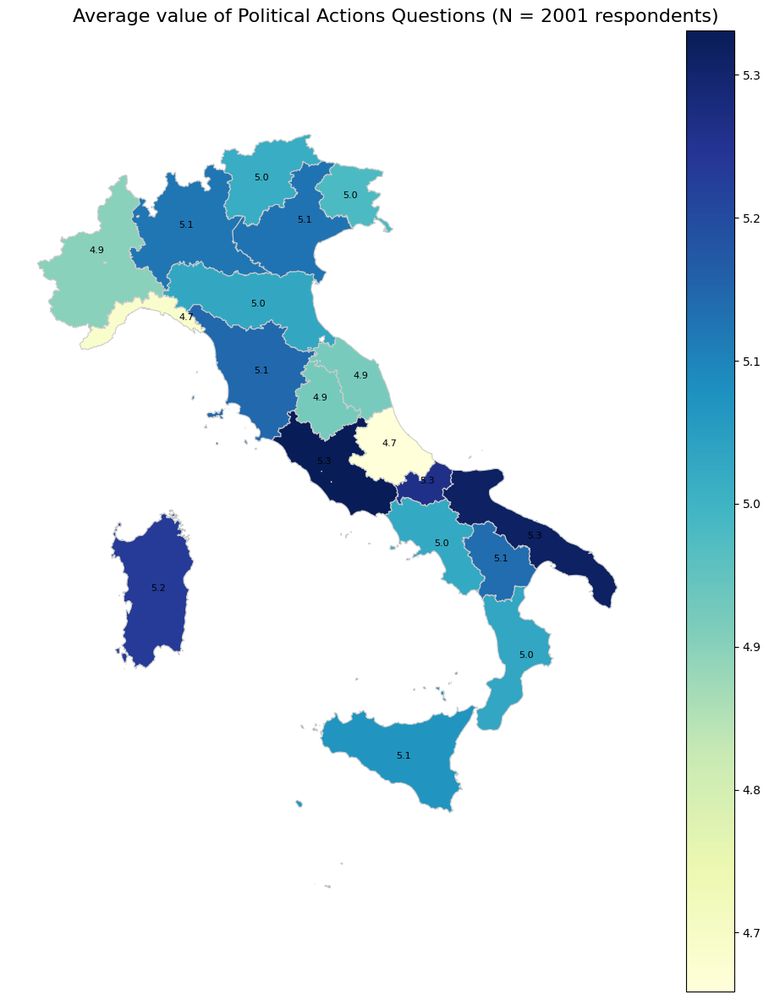

In [359]:
# Compute row-wise average of CE scores
df_pa["PA_avg"] = df_pa[pa_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_pa.groupby("regione_norm")["PA_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="PA_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['PA_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Political Actions Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

# 3. Concern and Knowledge

## 3.1. Knowledge Block

### 3.1.1. BLOCK AFK: Knowledge of Alternative Fuel

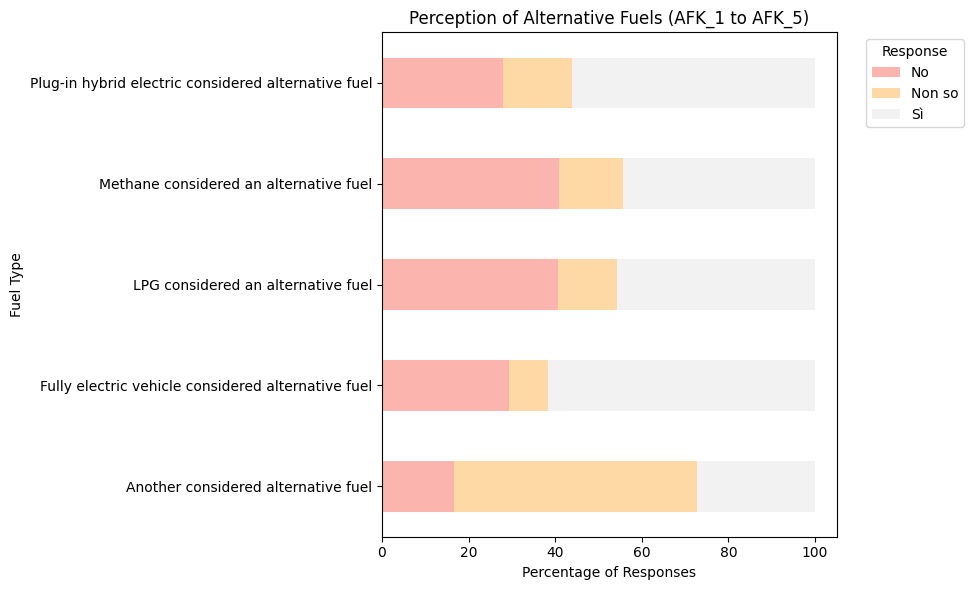

In [31]:
# Select AFK_1 to AFK_5 and map to description
afk_1_5_cols = [f"AFK_{i}" for i in range(1, 6)]
afk_1_5_cols = [col for col in afk_1_5_cols if col in df.columns]

# Prepare data
afk_1_5_long = df[afk_1_5_cols].melt(var_name="Code", value_name="Response")
afk_1_5_long["Description"] = afk_1_5_long["Code"].map(column_dict)

# Create 100% stacked bar chart
response_counts = afk_1_5_long.groupby(["Description", "Response"]).size().unstack(fill_value=0)
response_percent = response_counts.div(response_counts.sum(axis=1), axis=0) * 100

# Plot
response_percent.plot(kind='barh', stacked=True, figsize=(10, 6), colormap='Pastel1')
plt.title("Perception of Alternative Fuels (AFK_1 to AFK_5)")
plt.xlabel("Percentage of Responses")
plt.ylabel("Fuel Type")
plt.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [33]:
# Full Correct Code: Population Dynamic Chart for AFK_2 to AFK_5 with gender and age group

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [46]:

# Load data
df = pd.read_csv("./data/DF.csv", sep=";")
column_map = pd.read_excel("./data/Column_mapping.xlsx")
column_dict = dict(zip(column_map["Code"], column_map["Description"]))


In [35]:
# Define age bins and labels
age_bins_5 = list(range(0, 101, 5))
age_labels_5 = [f"{i}-{i+4}" for i in age_bins_5[:-1]]

# Define response categories and colors
response_order = ["Sì", "No", "Non so"]
response_legend_map = {"Sì": "Yes", "No": "No", "Non so": "Don't know"}
colors = {"Sì": "mediumseagreen", "No": "tomato", "Non so": "gold"}



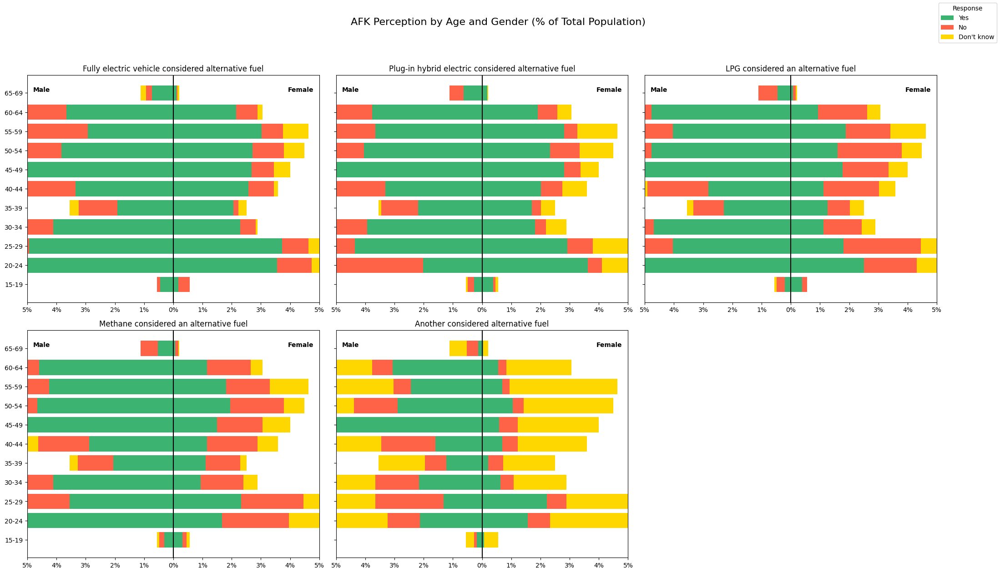

In [42]:
# Define AFK columns to visualize
afk_cols = [f"AFK_{i}" for i in range(1, 6)]


# Create a 3x3 subplot grid
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(22, 18), sharey=True)
axes = axes.flatten()

used_axes = 0

# Generate the plots
for col in afk_cols:
    if col not in df.columns:
        continue

    # Prepare data
    afk_data = df[["G1", "G2", col]].dropna()
    afk_data["G2"] = pd.to_numeric(afk_data["G2"], errors="coerce")
    afk_data["AgeGroup"] = pd.cut(afk_data["G2"], bins=age_bins_5, labels=age_labels_5, right=False)

    # Create crosstab and normalize by total population
    crosstab = afk_data.groupby(["AgeGroup", "G1", col], observed=True).size().unstack(fill_value=0)
    crosstab_percent = crosstab.div(crosstab.sum().sum()) * 100

    # Split by gender
    male_data = crosstab_percent.loc[crosstab_percent.index.get_level_values("G1") == "Maschio"]
    female_data = crosstab_percent.loc[crosstab_percent.index.get_level_values("G1") == "Femmina"]

    # Ensure all response columns are present
    for resp in response_order:
        if resp not in male_data.columns:
            male_data[resp] = 0
        if resp not in female_data.columns:
            female_data[resp] = 0

    # Filter out empty age groups
    valid_ages = sorted(set(male_data.index.get_level_values("AgeGroup")) |
                        set(female_data.index.get_level_values("AgeGroup")))

    valid_age_mask = [
        (male_data.xs("Maschio", level=1).reindex([age])[response_order].sum(axis=1).values[0] > 0 or
         female_data.xs("Femmina", level=1).reindex([age])[response_order].sum(axis=1).values[0] > 0)
        for age in valid_ages
    ]

    filtered_ages = [age for age, valid in zip(valid_ages, valid_age_mask) if valid]
    male_data_filtered = male_data.xs("Maschio", level=1).reindex(filtered_ages).fillna(0)
    female_data_filtered = female_data.xs("Femmina", level=1).reindex(filtered_ages).fillna(0)

    # Plotting on assigned axis
    ax = axes[used_axes]
    used_axes += 1
    bottom_m = np.zeros(len(filtered_ages))
    bottom_f = np.zeros(len(filtered_ages))

    for resp in response_order:
        m_vals = -male_data_filtered[resp].values
        f_vals = female_data_filtered[resp].values
        ax.barh(filtered_ages, m_vals, left=bottom_m, color=colors[resp], label=response_legend_map[resp])
        ax.barh(filtered_ages, f_vals, left=bottom_f, color=colors[resp])
        bottom_m += m_vals
        bottom_f += f_vals

    ax.axvline(0, color="black", linewidth=1.5)
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlim(-5, 5)
    xticks = np.arange(-5, 6, 1)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{abs(x)}%" for x in xticks])
    ax.text(-4.8, filtered_ages[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(4.8, filtered_ages[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')

# Remove unused axes
for i in range(used_axes, len(axes)):
    fig.delaxes(axes[i])

fig.suptitle("AFK Perception by Age and Gender (% of Total Population)", fontsize=16)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title="Response")
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

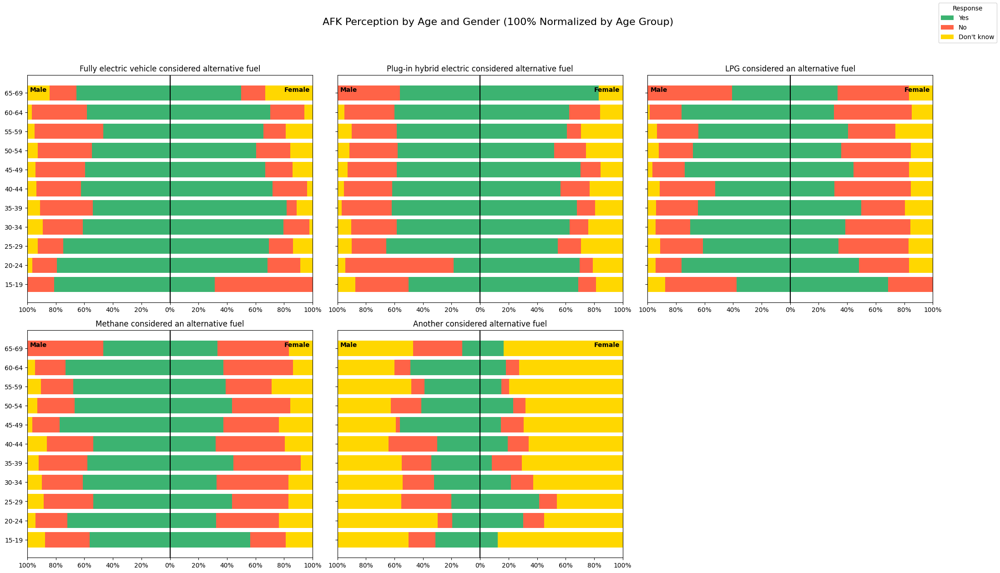

In [40]:
# Plot all AFK_1 to AFK_5 in a 3x3 subplot grid (even if only 4 used now)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(22, 18), sharey=True)
axes = axes.flatten()

used_axes = 0

for col in afk_cols:
    if col not in df.columns:
        continue

    # Prepare data
    afk_data = df[["G1", "G2", col]].dropna()
    afk_data["G2"] = pd.to_numeric(afk_data["G2"], errors="coerce")
    afk_data["AgeGroup"] = pd.cut(afk_data["G2"], bins=age_bins_5, labels=age_labels_5, right=False)

    crosstab = afk_data.groupby(["AgeGroup", "G1", col],observed=True).size().unstack(fill_value=0)
    crosstab_percent = crosstab.div(crosstab.sum(axis=1), axis=0) * 100

    male_data = crosstab_percent.loc[crosstab_percent.index.get_level_values("G1") == "Maschio"]
    female_data = crosstab_percent.loc[crosstab_percent.index.get_level_values("G1") == "Femmina"]

    for resp in response_order:
        if resp not in male_data.columns:
            male_data[resp] = 0
        if resp not in female_data.columns:
            female_data[resp] = 0

    valid_ages = sorted(set(male_data.index.get_level_values("AgeGroup")) |
                        set(female_data.index.get_level_values("AgeGroup")))

    valid_age_mask = [
        (male_data.xs("Maschio", level=1).reindex([age])[response_order].sum(axis=1).values[0] > 0 or
         female_data.xs("Femmina", level=1).reindex([age])[response_order].sum(axis=1).values[0] > 0)
        for age in valid_ages
    ]

    filtered_ages = [age for age, valid in zip(valid_ages, valid_age_mask) if valid]
    male_data_filtered = male_data.xs("Maschio", level=1).reindex(filtered_ages).fillna(0)
    female_data_filtered = female_data.xs("Femmina", level=1).reindex(filtered_ages).fillna(0)

    ax = axes[used_axes]
    used_axes += 1
    bottom_m = np.zeros(len(filtered_ages))
    bottom_f = np.zeros(len(filtered_ages))

    for resp in response_order:
        m_vals = -male_data_filtered[resp].values
        f_vals = female_data_filtered[resp].values
        ax.barh(filtered_ages, m_vals, left=bottom_m, color=colors[resp], label=response_legend_map[resp])
        ax.barh(filtered_ages, f_vals, left=bottom_f, color=colors[resp])
        bottom_m += m_vals
        bottom_f += f_vals

    ax.axvline(0, color="black", linewidth=1.5)
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

    # Gender subtitles
    ax.text(-100 + 2, filtered_ages[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(100 - 2, filtered_ages[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')

# Remove unused axes
for i in range(used_axes, len(axes)):
    fig.delaxes(axes[i])

fig.suptitle("AFK Perception by Age and Gender (100% Normalized by Age Group)", fontsize=16)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title="Response")
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

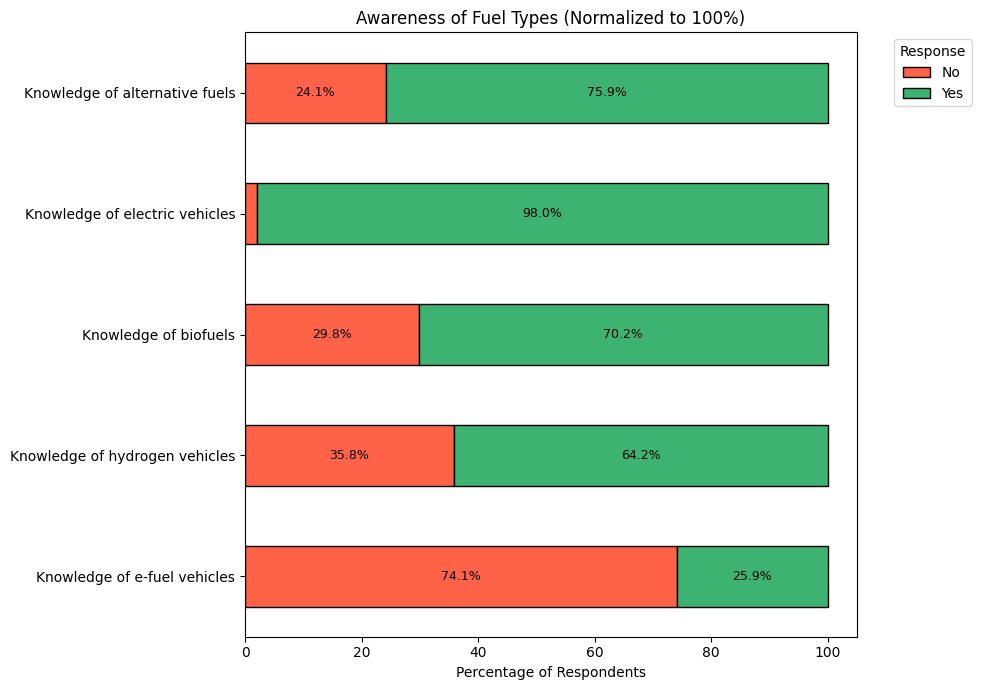

In [50]:
# Re-process with the fix: include AFK3intro, correct label centering, include "Don't know" responses

# Re-define the columns and ensure all are present
target_cols = ["AFKintro", "AFK1", "AFK2", "AFK3intro", "AFK4intro"]
target_cols = [col for col in target_cols if col in df.columns]

# Manually add the missing AFK3intro mapping to column_dict
column_dict["AFK3intro"] = "Knowledge of hydrogen vehicles"

# Melt the data
afk_intro_long = df[target_cols].melt(var_name="Code", value_name="Response")
afk_intro_long["Description"] = afk_intro_long["Code"].map(column_dict)

# Normalize responses: convert to English equivalents
afk_intro_long["Response"] = afk_intro_long["Response"].replace({
    "Sì": "Yes", "No": "No", "Non so": "Don't know"
})

# Compute response counts and normalize to percentage
response_counts_intro = afk_intro_long.groupby(["Description", "Response"]).size().unstack(fill_value=0)
response_percent_intro = response_counts_intro.div(response_counts_intro.sum(axis=1), axis=0) * 100

# Define custom order for the chart

custom_order = [
    "Knowledge of e-fuel vehicles",
    "Knowledge of hydrogen vehicles",
    "Knowledge of biofuels",
    "Knowledge of electric vehicles",
    "Knowledge of alternative fuels"
]

# Reorder the response percent dataframe
response_percent_intro_ordered = response_percent_intro.loc[custom_order]

# Plot with new order
fig, ax = plt.subplots(figsize=(10, 7))
colors_map = {"Yes": "mediumseagreen", "No": "tomato", "Don't know": "gold"}
bars = response_percent_intro_ordered.plot(kind='barh', stacked=True, ax=ax,
                                           color=[colors_map.get(col, 'grey') for col in response_percent_intro.columns],
                                           edgecolor='black')

# Add centered percentage labels
for i, (index, row) in enumerate(response_percent_intro_ordered.iterrows()):
    left = 0
    for response in response_percent_intro_ordered.columns:
        width = row.get(response, 0)
        if width > 5:
            ax.text(left + width / 2, i, f"{width:.1f}%", va='center', ha='center', fontsize=9, color='black')
        left += width

# Final styling
plt.title("Awareness of Fuel Types (Normalized to 100%)")
plt.xlabel("Percentage of Respondents")
plt.ylabel("")
plt.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

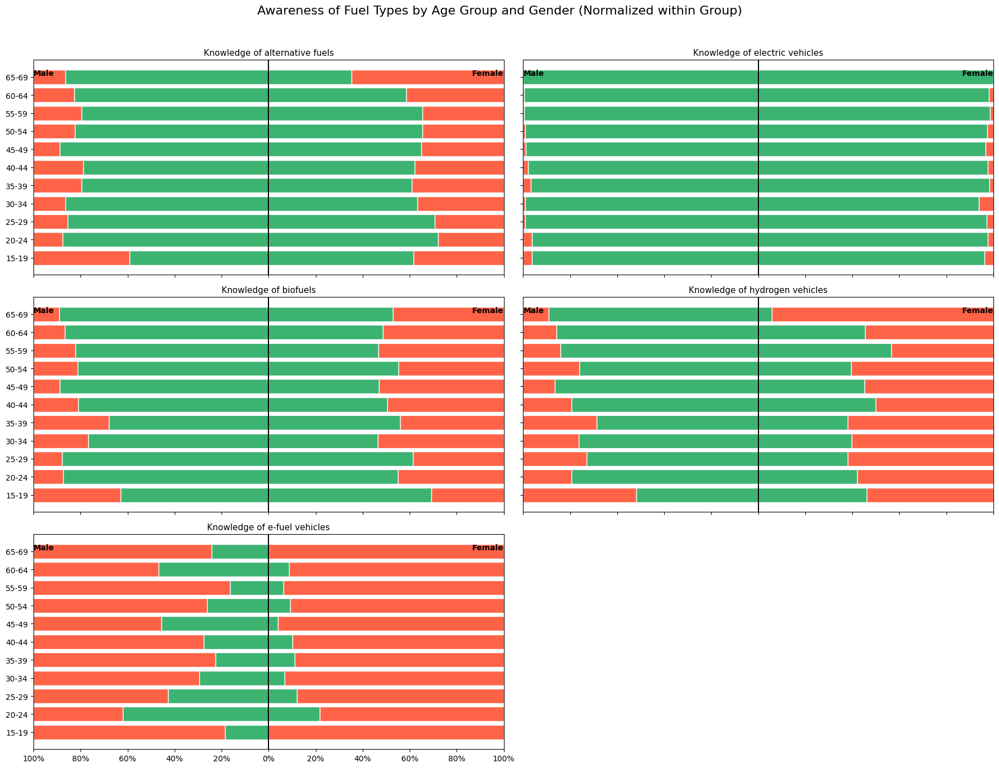

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load data
df = pd.read_csv("./data/DF.csv", sep=";")
column_map = pd.read_excel("./data/Column_mapping.xlsx")
column_dict = dict(zip(column_map["Code"], column_map["Description"]))

# Manually add missing description
column_dict["AFK3intro"] = "Knowledge of hydrogen vehicles"

# Define columns and custom order
target_cols = ["AFKintro", "AFK1", "AFK2", "AFK3intro", "AFK4intro"]
custom_order = [
    "Knowledge of alternative fuels",
    "Knowledge of electric vehicles",
    "Knowledge of biofuels",
    "Knowledge of hydrogen vehicles",
    "Knowledge of e-fuel vehicles"
]

# Define age bins
age_bins_5 = list(range(0, 101, 5))
age_labels_5 = [f"{i}-{i+4}" for i in age_bins_5[:-1]]

# Prepare dataframe
df["G2"] = pd.to_numeric(df["G2"], errors="coerce")
df["AgeGroup"] = pd.cut(df["G2"], bins=age_bins_5, labels=age_labels_5, right=False)

# Melt data for long format
df_subset = df[["G1", "AgeGroup"] + target_cols].dropna(subset=["G1", "AgeGroup"])
afk_breakdown = df_subset.melt(id_vars=["G1", "AgeGroup"], var_name="Code", value_name="Response")
afk_breakdown["Description"] = afk_breakdown["Code"].map(column_dict)
afk_breakdown["Response"] = afk_breakdown["Response"].replace({
    "Sì": "Yes", "No": "No", "Non so": "Don't know"
})

# Filter for known genders
afk_breakdown = afk_breakdown[afk_breakdown["G1"].isin(["Maschio", "Femmina"])]

# Group and normalize
grouped = (
    afk_breakdown.groupby(["Description", "AgeGroup", "G1", "Response"], observed=True)
    .size()
    .unstack(fill_value=0)
)
grouped_percent = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plotting in a 3x2 grid
fig, axes = plt.subplots(3, 2, figsize=(18, 14), sharex=True, sharey=True)
axes = axes.flatten()

for i, question in enumerate(custom_order):
    if question not in grouped_percent.index.get_level_values(0):
        continue

    ax = axes[i]
    # Get male and female data
    data_m = grouped_percent.loc[(question, slice(None), "Maschio")].fillna(0)
    data_f = grouped_percent.loc[(question, slice(None), "Femmina")].fillna(0)

    # Filter non-zero age groups
    age_groups = sorted(list(set(data_m.index) | set(data_f.index)))
    age_groups_valid = [ag for ag in age_groups if (data_m.loc[ag][["Yes", "No"]].sum() > 0).any() or
                        (data_f.loc[ag][["Yes", "No"]].sum() > 0).any()]

    data_m = data_m.loc[age_groups_valid]
    data_f = data_f.loc[age_groups_valid]

    y_pos = np.arange(len(age_groups_valid))
    bottom_m = np.zeros(len(y_pos))
    bottom_f = np.zeros(len(y_pos))

    for resp, color in zip(["Yes", "No"], ["mediumseagreen", "tomato"]):
        values_m = -data_m[resp].values
        values_f = data_f[resp].values
        ax.barh(y_pos, values_m, left=bottom_m, color=color, edgecolor="white")
        ax.barh(y_pos, values_f, left=bottom_f, color=color, edgecolor="white")
        bottom_m += values_m
        bottom_f += values_f

    ax.axvline(0, color='black', linewidth=1.5)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(age_groups_valid)
    ax.set_title(question, fontsize=11)
    ax.text(-100, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(100, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

# Remove unused subplot
if len(custom_order) < len(axes):
    for j in range(len(custom_order), len(axes)):
        fig.delaxes(axes[j])

# Layout
fig.suptitle("Awareness of Fuel Types by Age Group and Gender (Normalized within Group)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

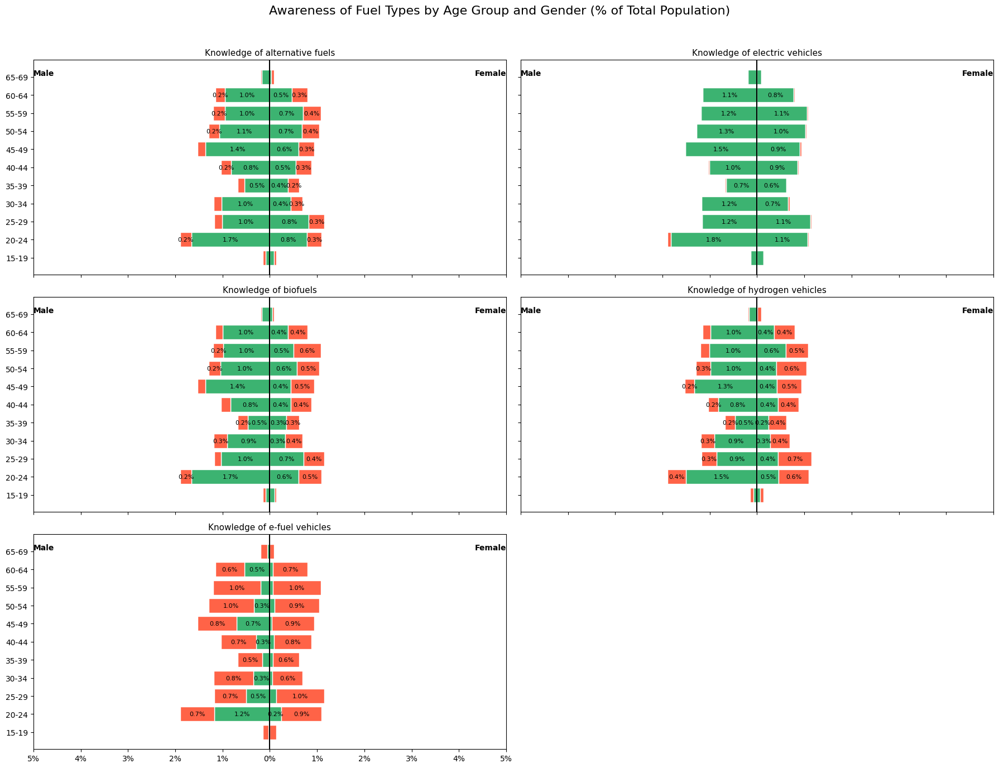

In [59]:
# Recreate the same chart with percentage signs in the axis tick labels

fig, axes = plt.subplots(3, 2, figsize=(18, 14), sharex=True, sharey=True)
axes = axes.flatten()

for i, question in enumerate(custom_order):
    if question not in grouped_total_percent.index.get_level_values(0):
        continue

    ax = axes[i]
    data_m = grouped_total_percent.loc[(question, slice(None), "Maschio")].fillna(0)
    data_f = grouped_total_percent.loc[(question, slice(None), "Femmina")].fillna(0)

    age_groups = sorted(list(set(data_m.index) | set(data_f.index)))
    age_groups_valid = [ag for ag in age_groups if (data_m.loc[ag][["Yes", "No"]].sum() > 0).any() or
                        (data_f.loc[ag][["Yes", "No"]].sum() > 0).any()]

    data_m = data_m.loc[age_groups_valid]
    data_f = data_f.loc[age_groups_valid]

    y_pos = np.arange(len(age_groups_valid))
    bottom_m = np.zeros(len(y_pos))
    bottom_f = np.zeros(len(y_pos))

    for resp, color in zip(["Yes", "No"], ["mediumseagreen", "tomato"]):
        values_m = -data_m[resp].values
        values_f = data_f[resp].values
        ax.barh(y_pos, values_m, left=bottom_m, color=color, edgecolor="white")
        ax.barh(y_pos, values_f, left=bottom_f, color=color, edgecolor="white")

        # Add labels
        for j, (vm, vf) in enumerate(zip(values_m, values_f)):
            if abs(vm) > 0.2:
                ax.text(bottom_m[j] + vm / 2, y_pos[j], f"{abs(vm):.1f}%", ha="center", va="center", fontsize=8)
            if abs(vf) > 0.2:
                ax.text(bottom_f[j] + vf / 2, y_pos[j], f"{vf:.1f}%", ha="center", va="center", fontsize=8)

        bottom_m += values_m
        bottom_f += values_f

    ax.axvline(0, color='black', linewidth=1.5)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(age_groups_valid)
    ax.set_title(question, fontsize=11)
    ax.text(-5, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(5, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-5, 5)
    ax.set_xticks(np.arange(-5, 6, 1))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-5, 6, 1)])

# Remove unused subplot
if len(custom_order) < len(axes):
    for j in range(len(custom_order), len(axes)):
        fig.delaxes(axes[j])

# Layout
fig.suptitle("Awareness of Fuel Types by Age Group and Gender (% of Total Population)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 3.1.2. BLOCK AFK1: Knowledge of Biofuels

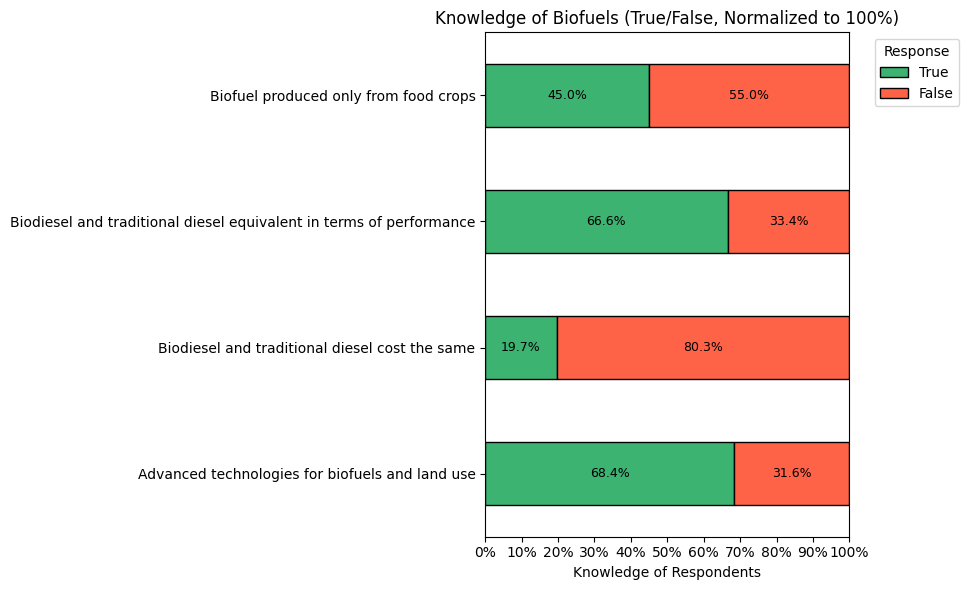

In [88]:
# Step 1: Remove duplicates by ID
df = df.drop_duplicates(subset="ID")

# Step 2: Filter for respondents who answered "Sì" to AFK1
df_filtered = df[df["AFK1"] == "Sì"]

# Step 3: Select AFK1bis columns
afk1bis_cols = ["AFK1bis_1", "AFK1bis_2", "AFK1bis_3", "AFK1bis_4"]

# Step 4: Melt the filtered dataframe
afk1bis_long = df_filtered[afk1bis_cols].melt(var_name="Code", value_name="Response")

# Step 5: Normalize string case and strip spaces
afk1bis_long["Response"] = afk1bis_long["Response"].astype(str).str.strip().str.lower()

# Step 6: Translate responses to English (after cleaning)
translation_map = {
    "vero": "True",
    "falso": "False"
}
afk1bis_long["Response"] = afk1bis_long["Response"].map(translation_map)

# Step 7: Drop rows with invalid or missing translations
afk1bis_long = afk1bis_long.dropna(subset=["Response"])

# Step 8: Map codes to question descriptions
afk1bis_long["Description"] = afk1bis_long["Code"].map(column_dict)

# Step 9: Count and normalize responses
response_counts = afk1bis_long.groupby(["Description", "Response"]).size().unstack().fillna(0)

# Ensure both "True" and "False" columns are present
for col in ["True", "False"]:
    if col not in response_counts.columns:
        response_counts[col] = 0

# Reorder and normalize to 100%
response_counts = response_counts[["True", "False"]]
response_percent = response_counts.div(response_counts.sum(axis=1), axis=0) * 100

# Step 10: Plot
colors = {"True": "mediumseagreen", "False": "tomato"}
fig, ax = plt.subplots(figsize=(10, 6))
bars = response_percent.plot(
    kind='barh',
    stacked=True,
    color=[colors["True"], colors["False"]],
    ax=ax,
    edgecolor="black"
)

# Add percentage labels
for i, (index, row) in enumerate(response_percent.iterrows()):
    left = 0
    for col in ["True", "False"]:
        width = row[col]
        if width > 5:
            ax.text(left + width / 2, i, f"{width:.1f}%", va='center', ha='center', fontsize=9)
        left += width

# Final formatting
ax.set_title("Knowledge of Biofuels (True/False, Normalized to 100%)")
ax.set_xlabel("Knowledge of Respondents")
ax.set_ylabel("")
ax.set_xlim(0, 100)
ax.set_xticks(np.arange(0, 101, 10))
ax.set_xticklabels([f"{x}%" for x in range(0, 101, 10)])
ax.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

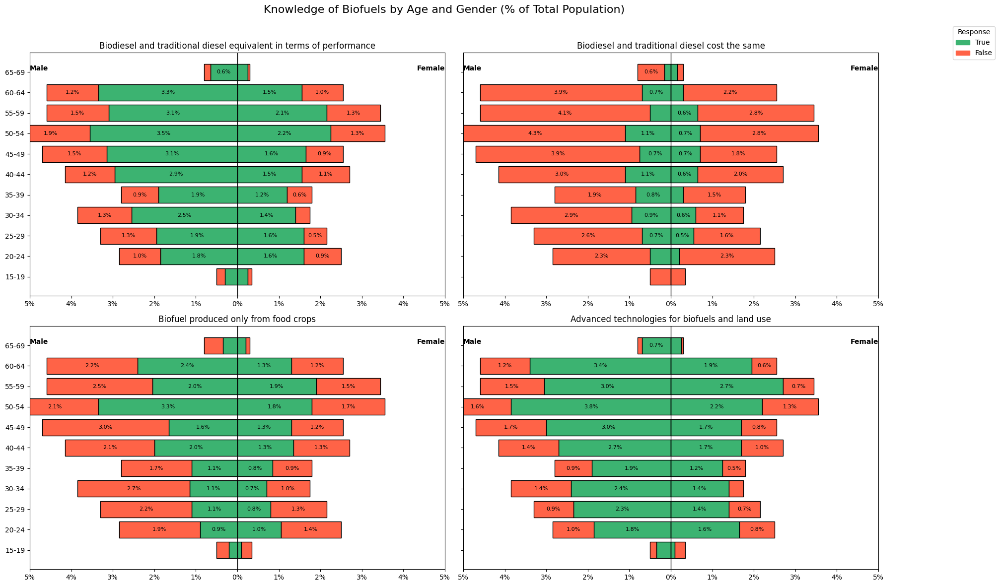

In [123]:
# Step 1: Filter respondents who answered "Sì" to AFK1
df_filtered = df[df["AFK1"] == "Sì"].copy()

# Step 2: Define AFK1bis columns
afk1bis_cols = ["AFK1bis_1", "AFK1bis_2", "AFK1bis_3", "AFK1bis_4"]
afk1bis_cols = [col for col in afk1bis_cols if col in df_filtered.columns]

# Step 3: Add age group
df_filtered["G2"] = pd.to_numeric(df_filtered["G2"], errors="coerce")
age_bins = list(range(15, 71, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df_filtered["AgeGroup"] = pd.cut(df_filtered["G2"], bins=age_bins, labels=age_labels, right=False)

# Step 4: Melt data
afk1bis_long = df_filtered[["G1", "AgeGroup"] + afk1bis_cols].melt(
    id_vars=["G1", "AgeGroup"], var_name="Code", value_name="Response"
)

# Step 5: Clean responses and translate
afk1bis_long["Response"] = afk1bis_long["Response"].astype(str).str.strip().str.lower()
afk1bis_long["Response"] = afk1bis_long["Response"].replace({"vero": "True", "falso": "False"})

# Drop invalid responses
afk1bis_long = afk1bis_long[afk1bis_long["Response"].isin(["True", "False"])]

# Map descriptions
afk1bis_long["Description"] = afk1bis_long["Code"].map(column_dict)

# Step 6: Plot layout
fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Colors and responses
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]
total_population = len(df)

# Step 7: Generate charts
for i, question in enumerate(afk1bis_cols):
    ax = axes[i]
    subset = afk1bis_long[afk1bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Group by age, gender, response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)
    ctab = ctab.div(total_population).fillna(0) * 100

    # Ensure consistent columns
    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Separate by gender and align
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"]
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"]
    all_ages = sorted(set(males.index.get_level_values("AgeGroup")) | set(females.index.get_level_values("AgeGroup")))

    males = males.droplevel(1).reindex(all_ages).fillna(0)
    females = females.droplevel(1).reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 0.5:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 0.5:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)

        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-5, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(5, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-5, 5)
    ax.set_xticks(np.arange(-5, 6, 1))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-5, 6, 1)])

# Final touches
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Knowledge of Biofuels by Age and Gender (% of Total Population)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

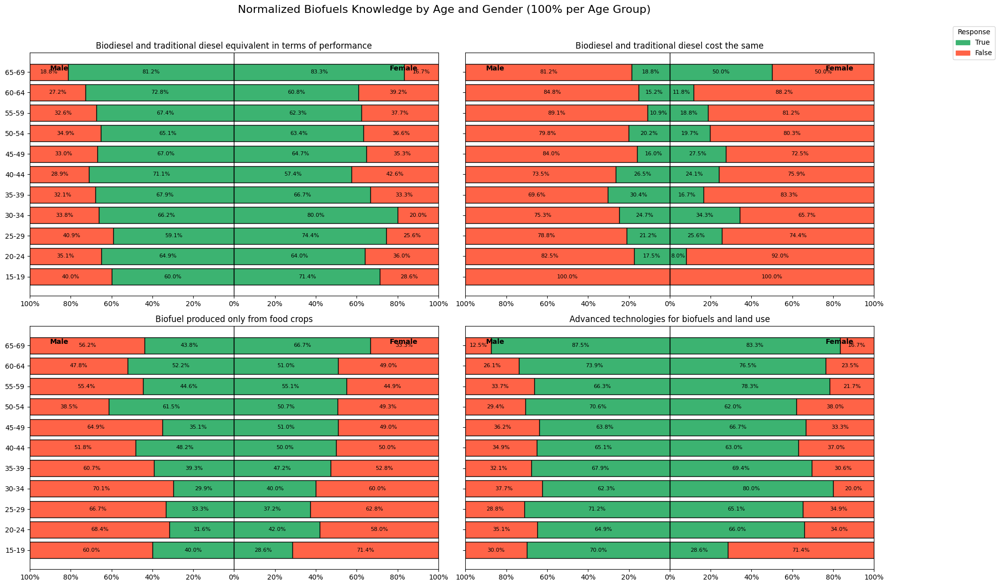

In [125]:
# Step 1: Normalize values within age group (stacked 100% for each age group by gender)

# We'll reuse `afk1bis_long` from previous filtered and cleaned data

# Set up 2x2 plot grid
fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Total responses per gender-age group (for normalization)
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]

for i, question in enumerate(afk1bis_cols):
    ax = axes[i]
    subset = afk1bis_long[afk1bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Count per AgeGroup, Gender, Response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)

    # Normalize by row (i.e. gender-age group total)
    ctab = ctab.div(ctab.sum(axis=1), axis=0).fillna(0) * 100

    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Male/Female
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"].droplevel(1)
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"].droplevel(1)

    all_ages = sorted(set(males.index) | set(females.index))
    males = males.reindex(all_ages).fillna(0)
    females = females.reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 2:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 2:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)
        
        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-90, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(90, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

# Final layout and legend
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Normalized Biofuels Knowledge by Age and Gender (100% per Age Group)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 3.1.3. BLOCK AFK2: Knowledge of Electric Vechicle

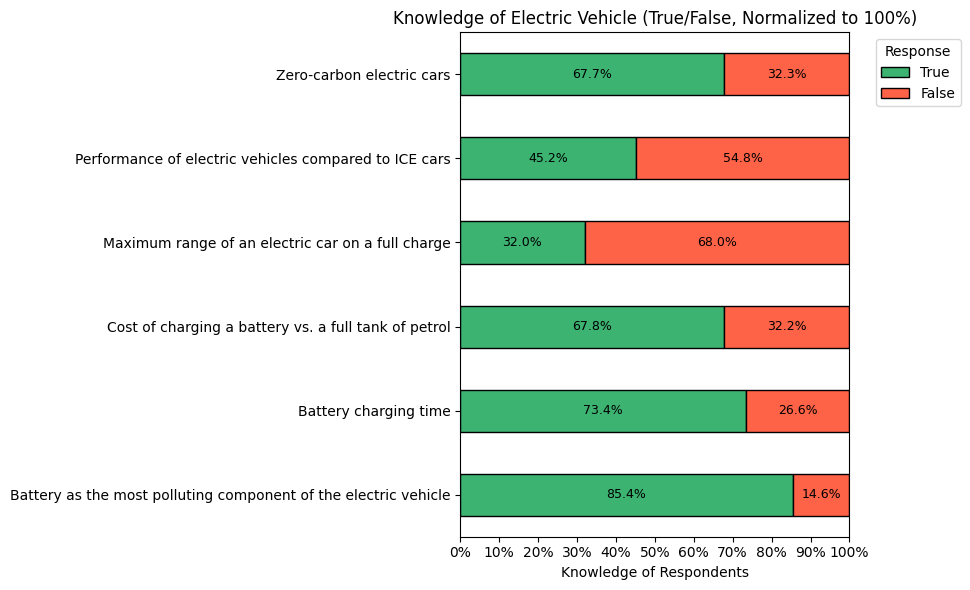

In [80]:
# Step 1: Remove duplicates by ID
df = df.drop_duplicates(subset="ID")

# Step 2: Filter for respondents who answered "Sì" to AFK1
df_filtered = df[df["AFK2"] == "Sì"]

# Step 3: Select AFK1bis columns
afk2bis_cols = ["AFK2bis_1", "AFK2bis_2", "AFK2bis_3", "AFK2bis_4", "AFK2bis_5", "AFK2bis_6"]

# Step 4: Melt the filtered dataframe
afk2bis_long = df_filtered[afk2bis_cols].melt(var_name="Code", value_name="Response")

# Step 5: Normalize string case and strip spaces
afk2bis_long["Response"] = afk2bis_long["Response"].astype(str).str.strip().str.lower()

# Step 6: Translate responses to English (after cleaning)
translation_map = {
    "vero": "True",
    "falso": "False"
}
afk2bis_long["Response"] = afk2bis_long["Response"].map(translation_map)

# Step 7: Drop rows with invalid or missing translations
afk2bis_long = afk2bis_long.dropna(subset=["Response"])

# Step 8: Map codes to question descriptions
afk2bis_long["Description"] = afk2bis_long["Code"].map(column_dict)

# Step 9: Count and normalize responses
response_counts = afk2bis_long.groupby(["Description", "Response"]).size().unstack().fillna(0)

# Ensure both "True" and "False" columns are present
for col in ["True", "False"]:
    if col not in response_counts.columns:
        response_counts[col] = 0

# Reorder and normalize to 100%
response_counts = response_counts[["True", "False"]]
response_percent = response_counts.div(response_counts.sum(axis=1), axis=0) * 100

# Step 10: Plot
colors = {"True": "mediumseagreen", "False": "tomato"}
fig, ax = plt.subplots(figsize=(10, 6))
bars = response_percent.plot(
    kind='barh',
    stacked=True,
    color=[colors["True"], colors["False"]],
    ax=ax,
    edgecolor="black"
)

# Add percentage labels
for i, (index, row) in enumerate(response_percent.iterrows()):
    left = 0
    for col in ["True", "False"]:
        width = row[col]
        if width > 5:
            ax.text(left + width / 2, i, f"{width:.1f}%", va='center', ha='center', fontsize=9)
        left += width

# Final formatting
ax.set_title("Knowledge of Electric Vehicle (True/False, Normalized to 100%)")
ax.set_xlabel("Knowledge of Respondents")
ax.set_ylabel("")
ax.set_xlim(0, 100)
ax.set_xticks(np.arange(0, 101, 10))
ax.set_xticklabels([f"{x}%" for x in range(0, 101, 10)])
ax.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

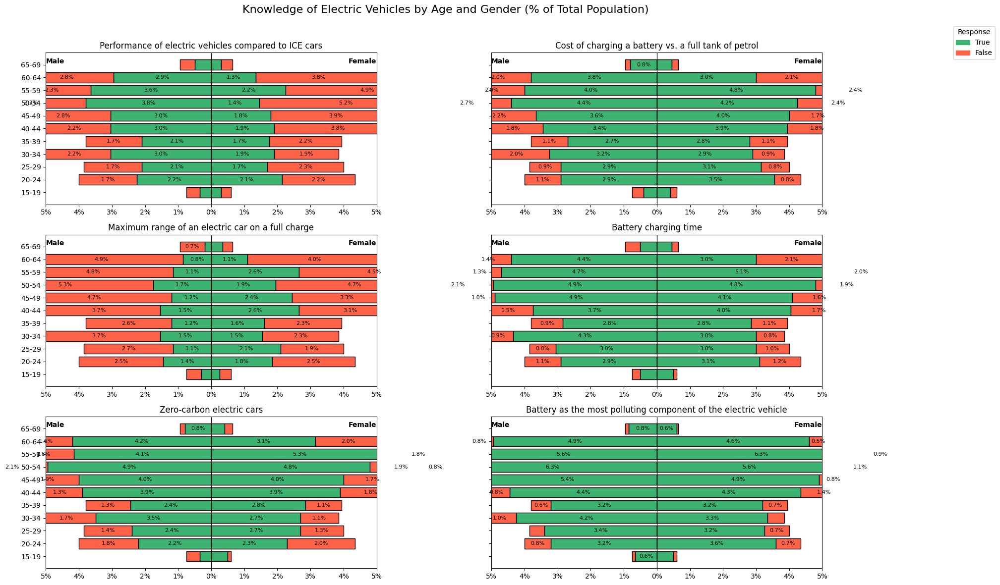

In [126]:
# Step 1: Filter respondents who answered "Sì" to AFK2
df_filtered = df[df["AFK2"] == "Sì"].copy()

# Step 2: Define AFK1bis columns
afk2bis_cols = ["AFK2bis_1", "AFK2bis_2", "AFK2bis_3", "AFK2bis_4", "AFK2bis_5", "AFK2bis_6"]
afk2bis_cols = [col for col in afk2bis_cols if col in df_filtered.columns]

# Step 3: Add age group
df_filtered["G2"] = pd.to_numeric(df_filtered["G2"], errors="coerce")
age_bins = list(range(15, 71, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df_filtered["AgeGroup"] = pd.cut(df_filtered["G2"], bins=age_bins, labels=age_labels, right=False)

# Step 4: Melt data
afk2bis_long = df_filtered[["G1", "AgeGroup"] + afk2bis_cols].melt(
    id_vars=["G1", "AgeGroup"], var_name="Code", value_name="Response"
)

# Step 5: Clean responses and translate
afk2bis_long["Response"] = afk2bis_long["Response"].astype(str).str.strip().str.lower()
afk2bis_long["Response"] = afk2bis_long["Response"].replace({"vero": "True", "falso": "False"})

# Drop invalid responses
afk2bis_long = afk2bis_long[afk2bis_long["Response"].isin(["True", "False"])]

# Map descriptions
afk2bis_long["Description"] = afk2bis_long["Code"].map(column_dict)

# Step 6: Plot layout
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Colors and responses
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]
total_population = len(df)

# Step 7: Generate charts
for i, question in enumerate(afk2bis_cols):
    ax = axes[i]
    subset = afk2bis_long[afk2bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Group by age, gender, response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)
    ctab = ctab.div(total_population).fillna(0) * 100

    # Ensure consistent columns
    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Separate by gender and align
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"]
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"]
    all_ages = sorted(set(males.index.get_level_values("AgeGroup")) | set(females.index.get_level_values("AgeGroup")))

    males = males.droplevel(1).reindex(all_ages).fillna(0)
    females = females.droplevel(1).reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 0.5:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 0.5:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)
    
        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-5, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(5, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-5, 5)
    ax.set_xticks(np.arange(-5, 6, 1))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-5, 6, 1)])

# Final touches
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Knowledge of Electric Vehicles by Age and Gender (% of Total Population)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

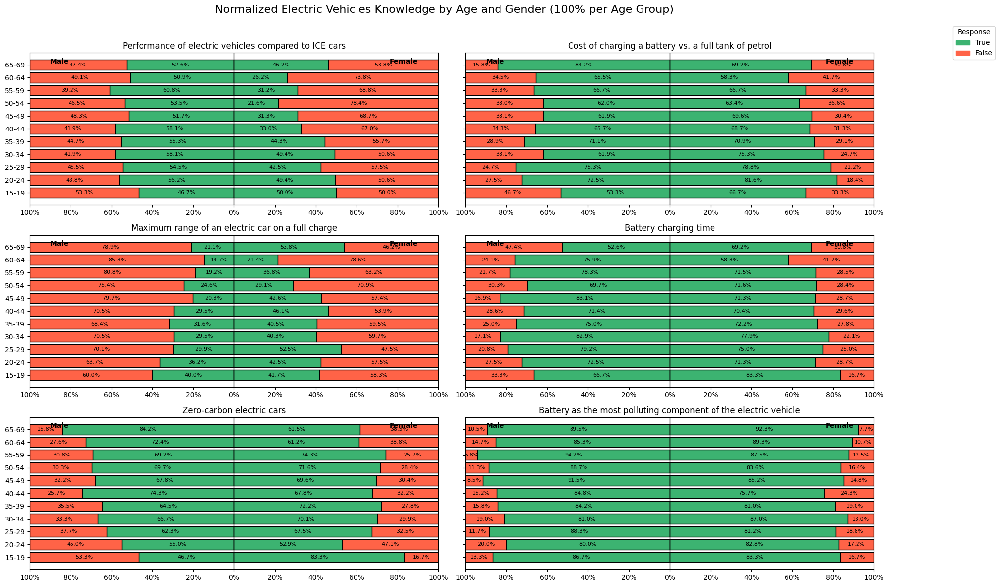

In [128]:
# Step 1: Normalize values within age group (stacked 100% for each age group by gender)

# We'll reuse `afk1bis_long` from previous filtered and cleaned data

# Set up 2x2 plot grid
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Total responses per gender-age group (for normalization)
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]

for i, question in enumerate(afk2bis_cols):
    ax = axes[i]
    subset = afk2bis_long[afk2bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Count per AgeGroup, Gender, Response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)

    # Normalize by row (i.e. gender-age group total)
    ctab = ctab.div(ctab.sum(axis=1), axis=0).fillna(0) * 100

    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Male/Female
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"].droplevel(1)
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"].droplevel(1)

    all_ages = sorted(set(males.index) | set(females.index))
    males = males.reindex(all_ages).fillna(0)
    females = females.reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 2:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 2:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)
        
        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-90, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(90, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

# Final layout and legend
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Normalized Electric Vehicles Knowledge by Age and Gender (100% per Age Group)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 3.1.4. BLOCK AFK3: Knowledge of Hydrogen Vehicle

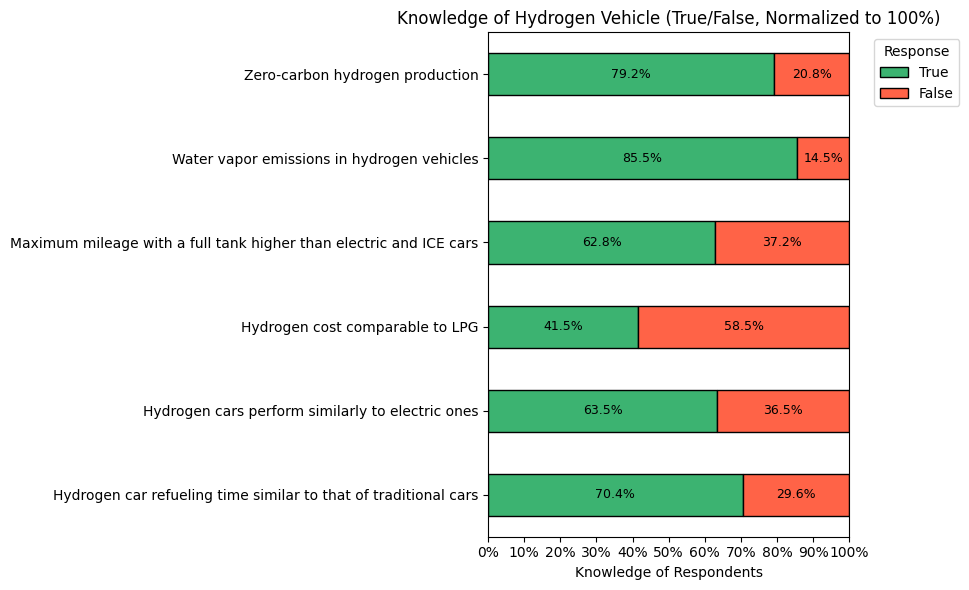

In [81]:
# Step 1: Remove duplicates by ID
df = df.drop_duplicates(subset="ID")

# Step 2: Filter for respondents who answered "Sì" to AFK1
df_filtered = df[df["AFK3intro"] == "Sì"]

# Step 3: Select AFK1bis columns
afk3bis_cols = ["AFK3_1", "AFK3_2", "AFK3_3", "AFK3_4", "AFK3_5", "AFK3_6"]

# Step 4: Melt the filtered dataframe
afk3bis_long = df_filtered[afk3bis_cols].melt(var_name="Code", value_name="Response")

# Step 5: Normalize string case and strip spaces
afk3bis_long["Response"] = afk3bis_long["Response"].astype(str).str.strip().str.lower()

# Step 6: Translate responses to English (after cleaning)
translation_map = {
    "vero": "True",
    "falso": "False"
}
afk3bis_long["Response"] = afk3bis_long["Response"].map(translation_map)

# Step 7: Drop rows with invalid or missing translations
afk3bis_long = afk3bis_long.dropna(subset=["Response"])

# Step 8: Map codes to question descriptions
afk3bis_long["Description"] = afk3bis_long["Code"].map(column_dict)

# Step 9: Count and normalize responses
response_counts = afk3bis_long.groupby(["Description", "Response"]).size().unstack().fillna(0)

# Ensure both "True" and "False" columns are present
for col in ["True", "False"]:
    if col not in response_counts.columns:
        response_counts[col] = 0

# Reorder and normalize to 100%
response_counts = response_counts[["True", "False"]]
response_percent = response_counts.div(response_counts.sum(axis=1), axis=0) * 100

# Step 10: Plot
colors = {"True": "mediumseagreen", "False": "tomato"}
fig, ax = plt.subplots(figsize=(10, 6))
bars = response_percent.plot(
    kind='barh',
    stacked=True,
    color=[colors["True"], colors["False"]],
    ax=ax,
    edgecolor="black"
)

# Add percentage labels
for i, (index, row) in enumerate(response_percent.iterrows()):
    left = 0
    for col in ["True", "False"]:
        width = row[col]
        if width > 5:
            ax.text(left + width / 2, i, f"{width:.1f}%", va='center', ha='center', fontsize=9)
        left += width

# Final formatting
ax.set_title("Knowledge of Hydrogen Vehicle (True/False, Normalized to 100%)")
ax.set_xlabel("Knowledge of Respondents")
ax.set_ylabel("")
ax.set_xlim(0, 100)
ax.set_xticks(np.arange(0, 101, 10))
ax.set_xticklabels([f"{x}%" for x in range(0, 101, 10)])
ax.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

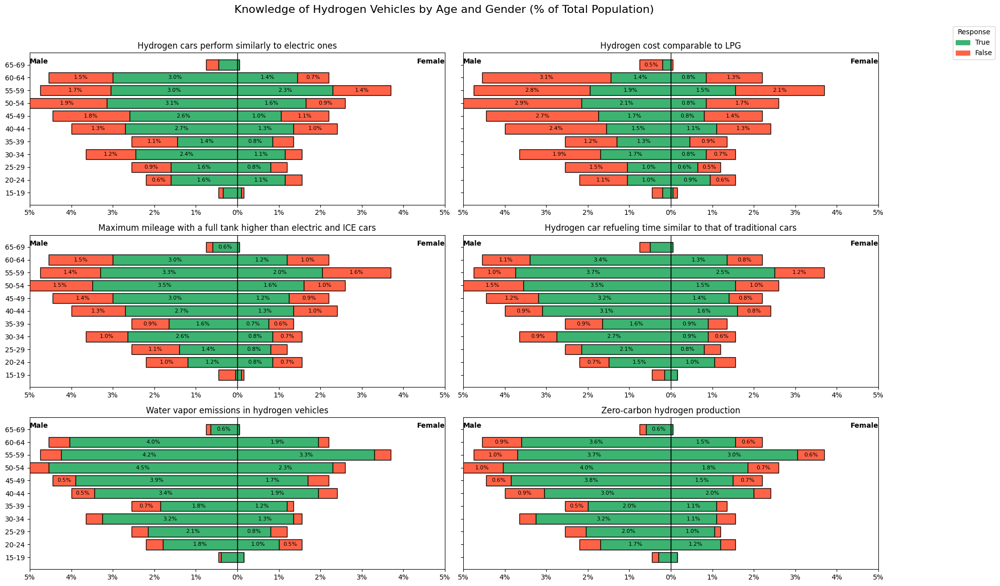

In [129]:
# Step 1: Filter respondents who answered "Sì" to AFK2
df_filtered = df[df["AFK3intro"] == "Sì"].copy()

# Step 2: Define AFK1bis columns
afk3bis_cols = ["AFK3_1", "AFK3_2", "AFK3_3", "AFK3_4", "AFK3_5", "AFK3_6"]
afk3bis_cols = [col for col in afk3bis_cols if col in df_filtered.columns]

# Step 3: Add age group
df_filtered["G2"] = pd.to_numeric(df_filtered["G2"], errors="coerce")
age_bins = list(range(15, 71, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df_filtered["AgeGroup"] = pd.cut(df_filtered["G2"], bins=age_bins, labels=age_labels, right=False)

# Step 4: Melt data
afk3bis_long = df_filtered[["G1", "AgeGroup"] + afk3bis_cols].melt(
    id_vars=["G1", "AgeGroup"], var_name="Code", value_name="Response"
)

# Step 5: Clean responses and translate
afk3bis_long["Response"] = afk3bis_long["Response"].astype(str).str.strip().str.lower()
afk3bis_long["Response"] = afk3bis_long["Response"].replace({"vero": "True", "falso": "False"})

# Drop invalid responses
afk3bis_long = afk3bis_long[afk3bis_long["Response"].isin(["True", "False"])]

# Map descriptions
afk3bis_long["Description"] = afk3bis_long["Code"].map(column_dict)

# Step 6: Plot layout
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Colors and responses
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]
total_population = len(df)

# Step 7: Generate charts
for i, question in enumerate(afk3bis_cols):
    ax = axes[i]
    subset = afk3bis_long[afk3bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Group by age, gender, response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)
    ctab = ctab.div(total_population).fillna(0) * 100

    # Ensure consistent columns
    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Separate by gender and align
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"]
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"]
    all_ages = sorted(set(males.index.get_level_values("AgeGroup")) | set(females.index.get_level_values("AgeGroup")))

    males = males.droplevel(1).reindex(all_ages).fillna(0)
    females = females.droplevel(1).reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 0.5:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 0.5:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)
        
        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-5, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(5, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-5, 5)
    ax.set_xticks(np.arange(-5, 6, 1))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-5, 6, 1)])

# Final touches
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Knowledge of Hydrogen Vehicles by Age and Gender (% of Total Population)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

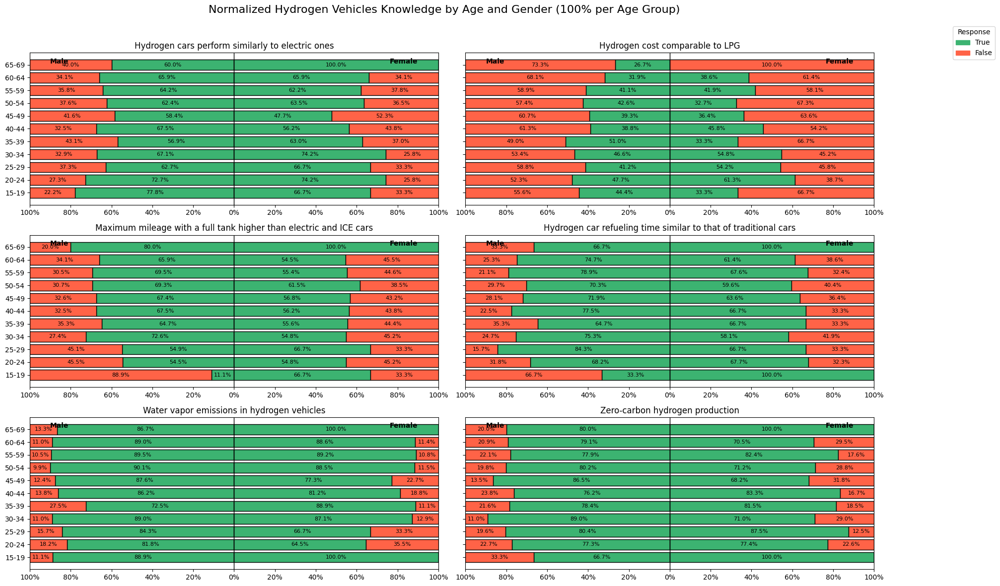

In [130]:
# Step 1: Normalize values within age group (stacked 100% for each age group by gender)

# We'll reuse `afk1bis_long` from previous filtered and cleaned data

# Set up 2x2 plot grid
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Total responses per gender-age group (for normalization)
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]

for i, question in enumerate(afk3bis_cols):
    ax = axes[i]
    subset = afk3bis_long[afk3bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Count per AgeGroup, Gender, Response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)

    # Normalize by row (i.e. gender-age group total)
    ctab = ctab.div(ctab.sum(axis=1), axis=0).fillna(0) * 100

    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Male/Female
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"].droplevel(1)
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"].droplevel(1)

    all_ages = sorted(set(males.index) | set(females.index))
    males = males.reindex(all_ages).fillna(0)
    females = females.reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 2:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 2:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)

        
        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-90, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(90, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

# Final layout and legend
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Normalized Hydrogen Vehicles Knowledge by Age and Gender (100% per Age Group)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 3.1.5. BLOCK AFK4: Knowledge of efuels

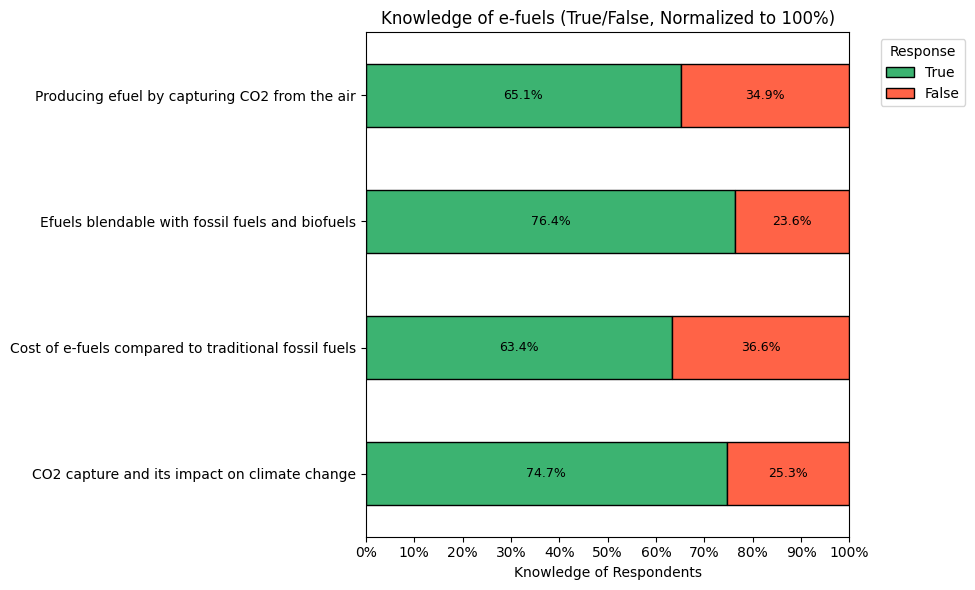

In [82]:
# Step 1: Remove duplicates by ID
df = df.drop_duplicates(subset="ID")

# Step 2: Filter for respondents who answered "Sì" to AFK1
df_filtered = df[df["AFK4intro"] == "Sì"]

# Step 3: Select AFK1bis columns
afk4bis_cols = ["AFK4_1", "AFK4_2", "AFK4_3", "AFK4_4"]

# Step 4: Melt the filtered dataframe
afk4bis_long = df_filtered[afk4bis_cols].melt(var_name="Code", value_name="Response")

# Step 5: Normalize string case and strip spaces
afk4bis_long["Response"] = afk4bis_long["Response"].astype(str).str.strip().str.lower()

# Step 6: Translate responses to English (after cleaning)
translation_map = {
    "vero": "True",
    "falso": "False"
}
afk4bis_long["Response"] = afk4bis_long["Response"].map(translation_map)

# Step 7: Drop rows with invalid or missing translations
afk4bis_long = afk4bis_long.dropna(subset=["Response"])

# Step 8: Map codes to question descriptions
afk4bis_long["Description"] = afk4bis_long["Code"].map(column_dict)

# Step 9: Count and normalize responses
response_counts = afk4bis_long.groupby(["Description", "Response"]).size().unstack().fillna(0)

# Ensure both "True" and "False" columns are present
for col in ["True", "False"]:
    if col not in response_counts.columns:
        response_counts[col] = 0

# Reorder and normalize to 100%
response_counts = response_counts[["True", "False"]]
response_percent = response_counts.div(response_counts.sum(axis=1), axis=0) * 100

# Step 10: Plot
colors = {"True": "mediumseagreen", "False": "tomato"}
fig, ax = plt.subplots(figsize=(10, 6))
bars = response_percent.plot(
    kind='barh',
    stacked=True,
    color=[colors["True"], colors["False"]],
    ax=ax,
    edgecolor="black"
)

# Add percentage labels
for i, (index, row) in enumerate(response_percent.iterrows()):
    left = 0
    for col in ["True", "False"]:
        width = row[col]
        if width > 5:
            ax.text(left + width / 2, i, f"{width:.1f}%", va='center', ha='center', fontsize=9)
        left += width

# Final formatting
ax.set_title("Knowledge of e-fuels (True/False, Normalized to 100%)")
ax.set_xlabel("Knowledge of Respondents")
ax.set_ylabel("")
ax.set_xlim(0, 100)
ax.set_xticks(np.arange(0, 101, 10))
ax.set_xticklabels([f"{x}%" for x in range(0, 101, 10)])
ax.legend(title="Response", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

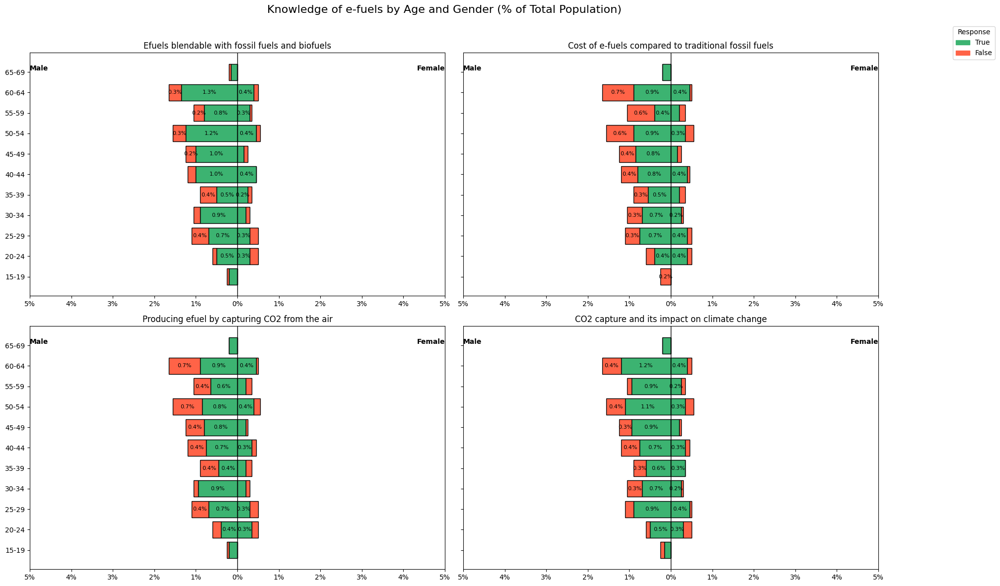

In [131]:
# Step 1: Filter respondents who answered "Sì" to AFK2
df_filtered = df[df["AFK4intro"] == "Sì"].copy()

# Step 2: Define AFK1bis columns
afk4bis_cols = ["AFK4_1", "AFK4_2", "AFK4_3", "AFK4_4"]
afk4bis_cols = [col for col in afk4bis_cols if col in df_filtered.columns]

# Step 3: Add age group
df_filtered["G2"] = pd.to_numeric(df_filtered["G2"], errors="coerce")
age_bins = list(range(15, 71, 5))
age_labels = [f"{i}-{i+4}" for i in age_bins[:-1]]
df_filtered["AgeGroup"] = pd.cut(df_filtered["G2"], bins=age_bins, labels=age_labels, right=False)

# Step 4: Melt data
afk4bis_long = df_filtered[["G1", "AgeGroup"] + afk4bis_cols].melt(
    id_vars=["G1", "AgeGroup"], var_name="Code", value_name="Response"
)

# Step 5: Clean responses and translate
afk4bis_long["Response"] = afk4bis_long["Response"].astype(str).str.strip().str.lower()
afk4bis_long["Response"] = afk4bis_long["Response"].replace({"vero": "True", "falso": "False"})

# Drop invalid responses
afk4bis_long = afk4bis_long[afk4bis_long["Response"].isin(["True", "False"])]

# Map descriptions
afk4bis_long["Description"] = afk4bis_long["Code"].map(column_dict)

# Step 6: Plot layout
fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Colors and responses
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]
total_population = len(df)

# Step 7: Generate charts
for i, question in enumerate(afk4bis_cols):
    ax = axes[i]
    subset = afk4bis_long[afk4bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Group by age, gender, response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)
    ctab = ctab.div(total_population).fillna(0) * 100

    # Ensure consistent columns
    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Separate by gender and align
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"]
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"]
    all_ages = sorted(set(males.index.get_level_values("AgeGroup")) | set(females.index.get_level_values("AgeGroup")))

    males = males.droplevel(1).reindex(all_ages).fillna(0)
    females = females.droplevel(1).reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 0.2:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 0.2:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)

        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-5, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(5, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-5, 5)
    ax.set_xticks(np.arange(-5, 6, 1))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-5, 6, 1)])

# Final touches
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Knowledge of e-fuels by Age and Gender (% of Total Population)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

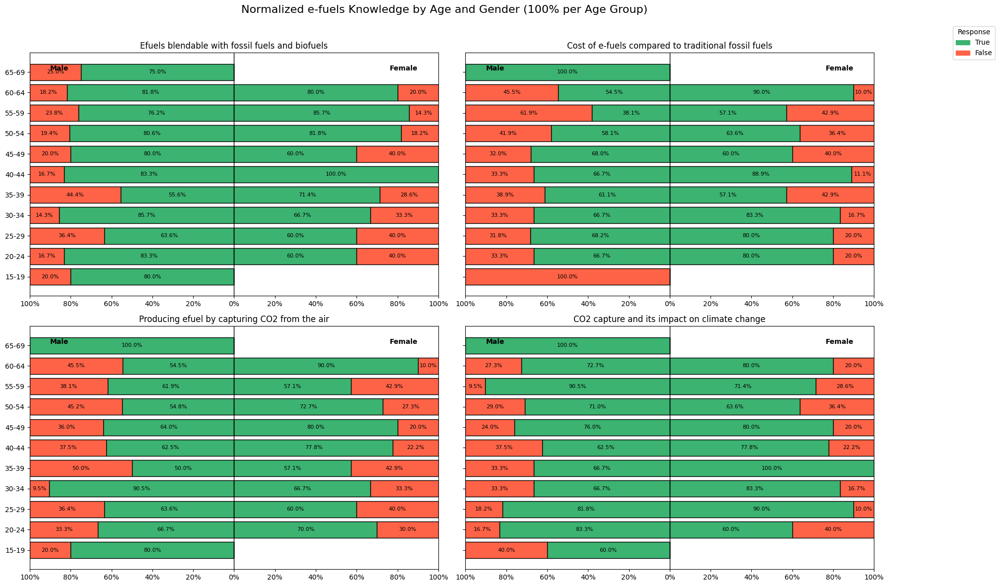

In [132]:
# Step 1: Normalize values within age group (stacked 100% for each age group by gender)

# We'll reuse `afk1bis_long` from previous filtered and cleaned data

# Set up 2x2 plot grid
fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Total responses per gender-age group (for normalization)
colors = {"True": "mediumseagreen", "False": "tomato"}
response_order = ["True", "False"]

for i, question in enumerate(afk4bis_cols):
    ax = axes[i]
    subset = afk4bis_long[afk4bis_long["Code"] == question].dropna(subset=["AgeGroup", "Response"])

    # Count per AgeGroup, Gender, Response
    ctab = subset.groupby(["AgeGroup", "G1", "Response"],observed=True).size().unstack(fill_value=0)

    # Normalize by row (i.e. gender-age group total)
    ctab = ctab.div(ctab.sum(axis=1), axis=0).fillna(0) * 100

    for col in response_order:
        if col not in ctab.columns:
            ctab[col] = 0
    ctab = ctab[response_order]

    # Male/Female
    males = ctab.loc[ctab.index.get_level_values("G1") == "Maschio"].droplevel(1)
    females = ctab.loc[ctab.index.get_level_values("G1") == "Femmina"].droplevel(1)

    all_ages = sorted(set(males.index) | set(females.index))
    males = males.reindex(all_ages).fillna(0)
    females = females.reindex(all_ages).fillna(0)

    bottoms_m = np.zeros(len(males))
    bottoms_f = np.zeros(len(females))
    y = np.arange(len(all_ages))

    for resp in response_order:
        m_vals = -males[resp].values
        f_vals = females[resp].values
        ax.barh(y, m_vals, left=bottoms_m, color=colors[resp], edgecolor='black')
        ax.barh(y, f_vals, left=bottoms_f, color=colors[resp], edgecolor='black')

        # Add % labels
        for j, (mv, fv, bm, bf) in enumerate(zip(m_vals, f_vals, bottoms_m, bottoms_f)):
            if abs(mv) > 2:
                ax.text(bm + mv / 2, y[j], f"{abs(mv):.1f}%", ha="center", va="center", color="black", fontsize=8)
            if abs(fv) > 2:
                ax.text(bf + fv / 2, y[j], f"{fv:.1f}%", ha="center", va="center", color="black", fontsize=8)

        bottoms_m += m_vals
        bottoms_f += f_vals

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(y)
    ax.set_yticklabels([str(a) for a in all_ages])
    ax.set_title(column_dict.get(question, question))
    ax.text(-90, y_pos[-1], "Male", fontsize=10, weight='bold', ha='left', va='bottom')
    ax.text(90, y_pos[-1], "Female", fontsize=10, weight='bold', ha='right', va='bottom')
    ax.set_xlim(-100, 100)
    ax.set_xticks(np.arange(-100, 101, 20))
    ax.set_xticklabels([f"{abs(x)}%" for x in np.arange(-100, 101, 20)])

# Final layout and legend
fig.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in response_order],
           response_order, title="Response", loc='upper right', bbox_to_anchor=(1.12, 0.95))
fig.suptitle("Normalized e-fuels Knowledge by Age and Gender (100% per Age Group)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 3.2. Concern about alternative fuels

In [247]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import unicodedata

# Normalize text
def normalize(s):
    return unicodedata.normalize('NFKD', str(s)).encode('ascii', errors='ignore').decode('utf-8').strip().lower()

# Load data
df = pd.read_csv("./data/DF.csv", sep=";")
gdf = gpd.read_file("./data/limits_IT_regions.geojson")

# Reload Column_mapping to recover column_dict
column_map = pd.read_excel("./data/Column_mapping.xlsx")
column_dict = dict(zip(column_map["Code"], column_map["Description"]))


# Normalize region names
df["regione_norm"] = df["regione"].apply(normalize)
gdf["reg_name_norm"] = gdf["reg_name"].apply(normalize)

# Drop duplicate IDs
df = df.drop_duplicates(subset="ID")

### 3.2.1. Environmental Concern

In [312]:
ce_columns = ["CE_1", "CE_2", "CE_3", "CE_4"]
df_ce = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_ce)
n_respondents

2001

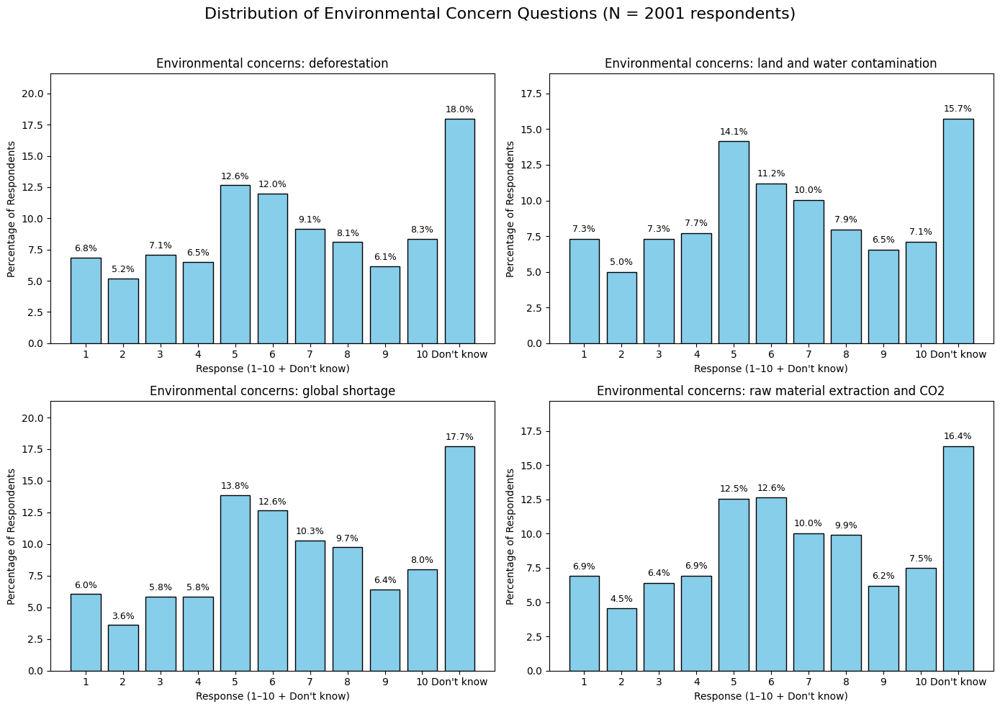

In [313]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(ce_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_ce[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)
# Global title
plt.suptitle(f"Distribution of Environmental Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [314]:
ce_columns = ["CE_1", "CE_2", "CE_3", "CE_4"]
df_ce = df.copy()

# Replace "Non so" with NaN for averaging
for col in ce_columns:
    #df_ce[col] = df_ce[col].replace("Non so", 5)
    df_ce[col] = pd.to_numeric(df_ce[col].replace("Non so", pd.NA), errors="coerce")

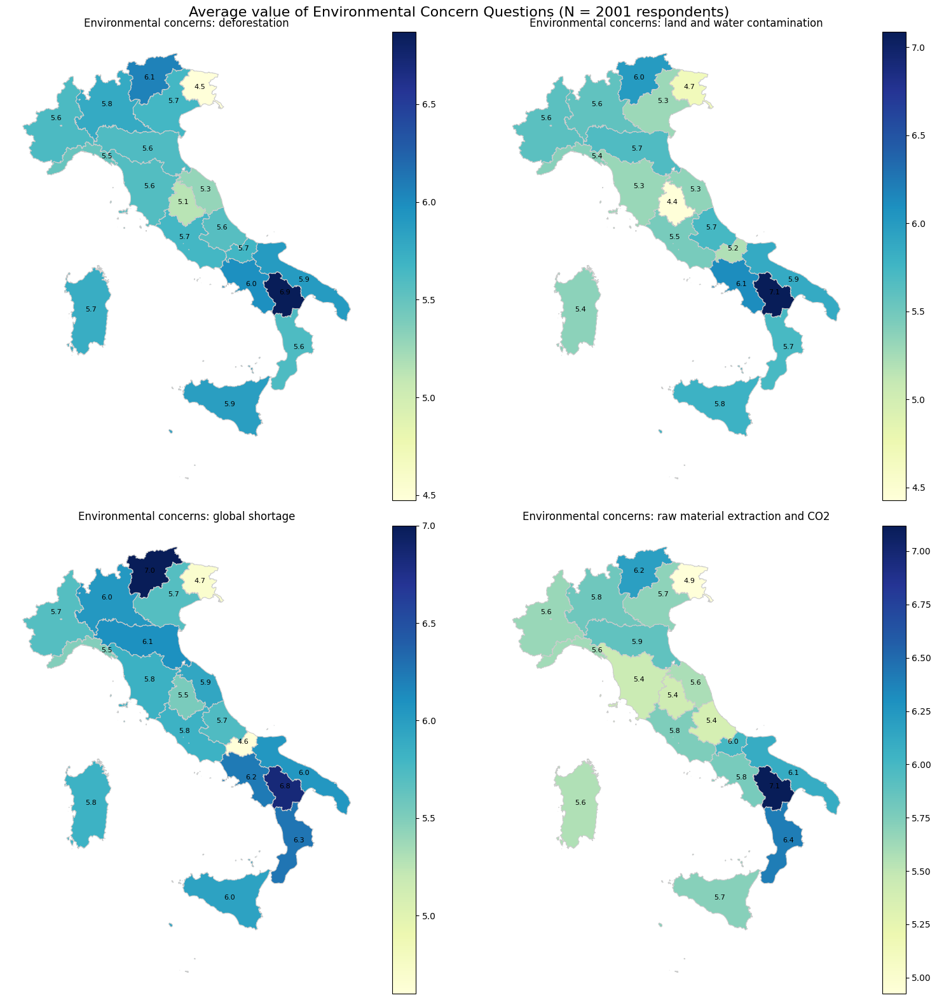

In [315]:
# Compute regional averages
region_scores = df_ce.groupby("regione_norm")[["CE_1", "CE_2", "CE_3", "CE_4"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
ce_columns = ["CE_1", "CE_2", "CE_3", "CE_4"]


for ax, col, title in zip(axes.flatten(), ce_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Environmental Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

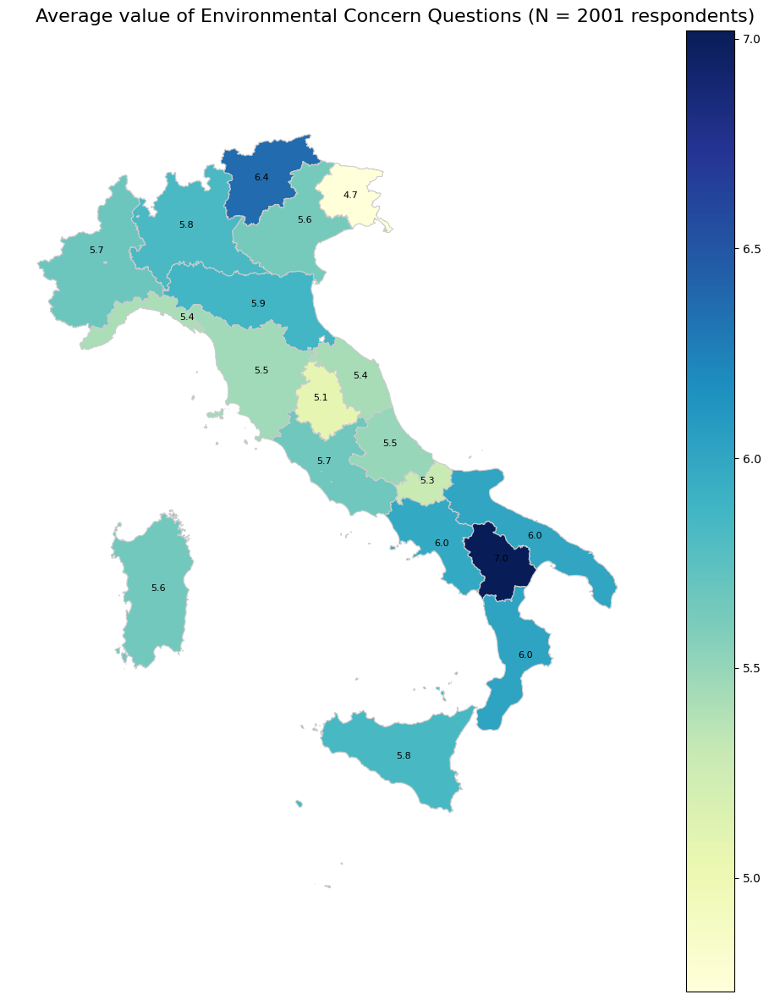

In [318]:
# Compute row-wise average of CE scores
df_ce["CE_avg"] = df_ce[ce_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_ce.groupby("regione_norm")["CE_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="CE_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['CE_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Environmental Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 3.2.2. Technical Concern

In [272]:
ct_columns = ["CT_1", "CT_2", "CT_3", "CT_4"]
df_ct = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_ct)
n_respondents

2001

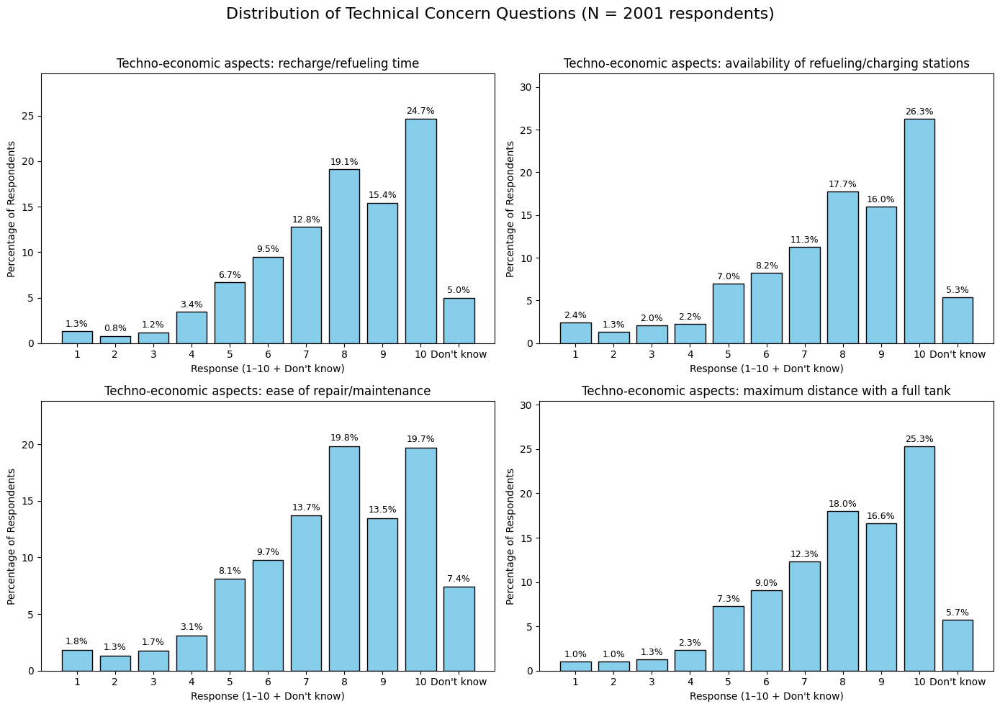

In [274]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(ct_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_ct[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)

# Add global title with number of respondents
plt.suptitle(f"Distribution of Technical Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [276]:
ct_columns = ["CT_1", "CT_2", "CT_3", "CT_4"]
df_ct = df.copy()

# Replace "Non so" with NaN for averaging
for col in ct_columns:
    df_ct[col] = pd.to_numeric(df_ct[col].replace("Non so", pd.NA), errors="coerce")


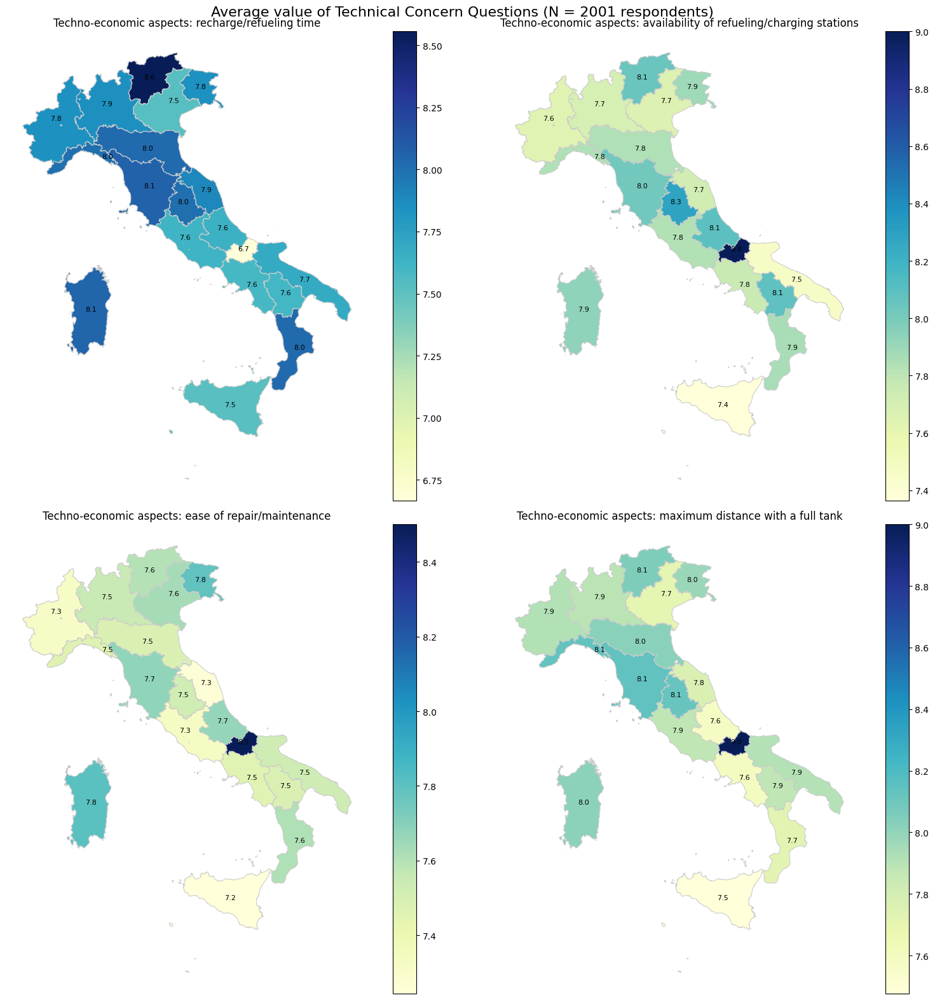

In [278]:
# Compute regional averages
region_scores = df_ct.groupby("regione_norm")[["CT_1", "CT_2", "CT_3", "CT_4"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
ct_columns = ["CT_1", "CT_2", "CT_3", "CT_4"]


for ax, col, title in zip(axes.flatten(), ct_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Technical Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

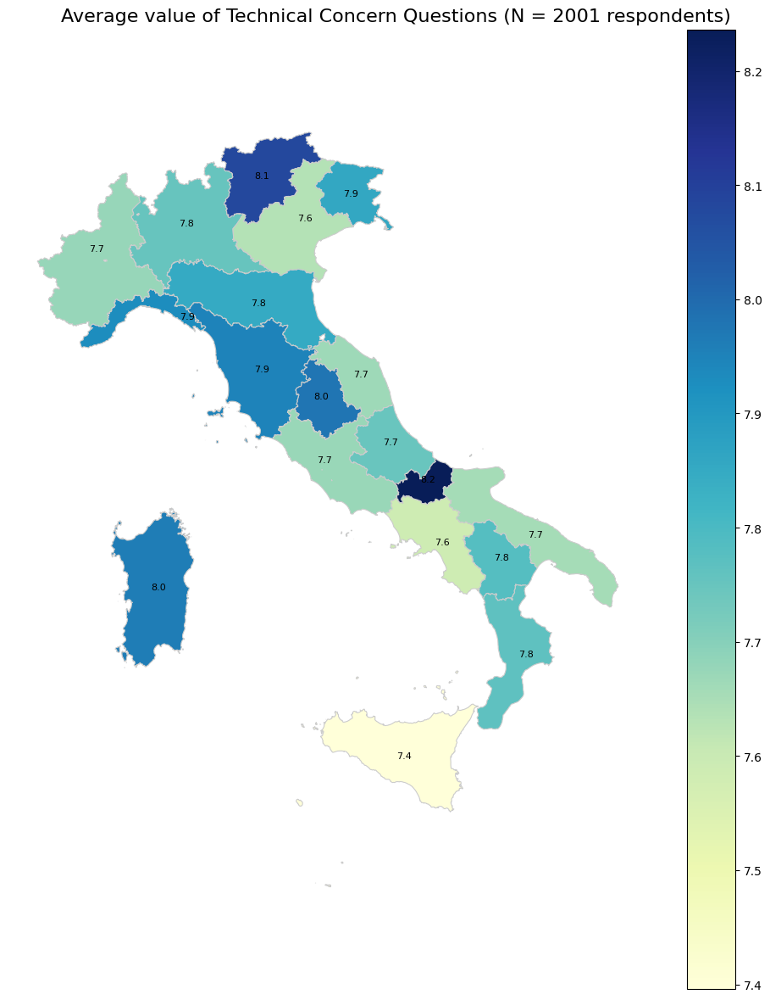

In [277]:
# Compute row-wise average of CE scores
df_ct["CT_avg"] = df_ct[ct_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_ct.groupby("regione_norm")["CT_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="CT_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['CT_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Technical Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 3.2.3. Safety Concern

In [280]:
sc_columns = ["SC_1", "SC_2", "SC_3", "SC_4"]
df_sc = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_sc)
n_respondents

2001

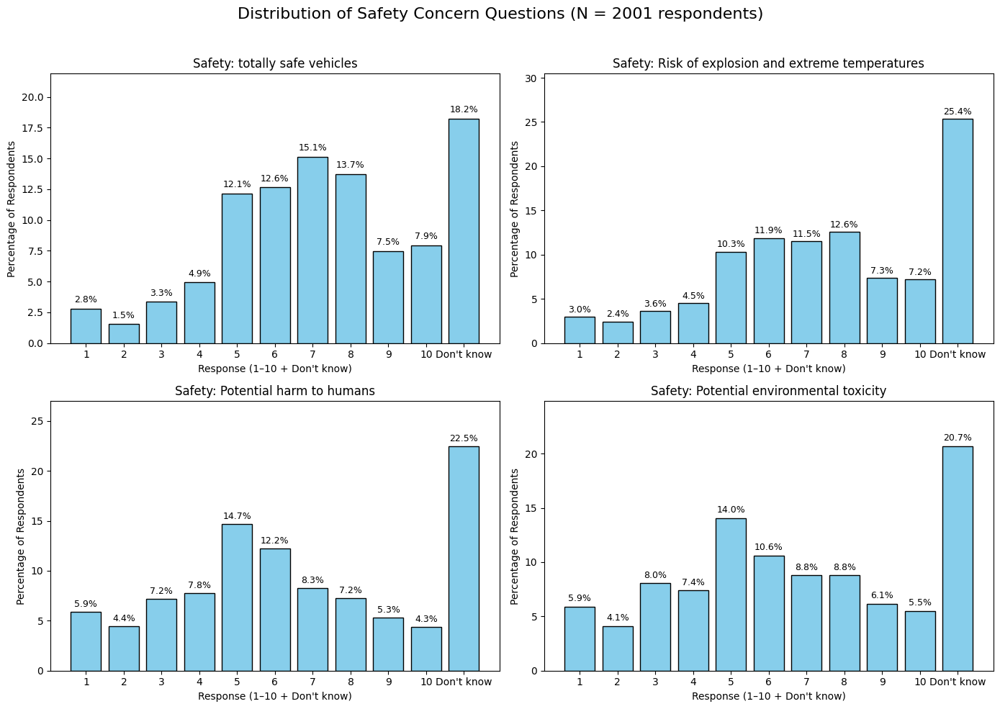

In [281]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(sc_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_sc[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)


# Add global title with number of respondents
plt.suptitle(f"Distribution of Safety Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [286]:
sc_columns = ["SC_1", "SC_2", "SC_3", "SC_4"]
df_sc = df.copy()
# Replace "Non so" with NaN for averaging
for col in sc_columns:
    df_sc[col] = pd.to_numeric(df_sc[col].replace("Non so", pd.NA), errors="coerce")

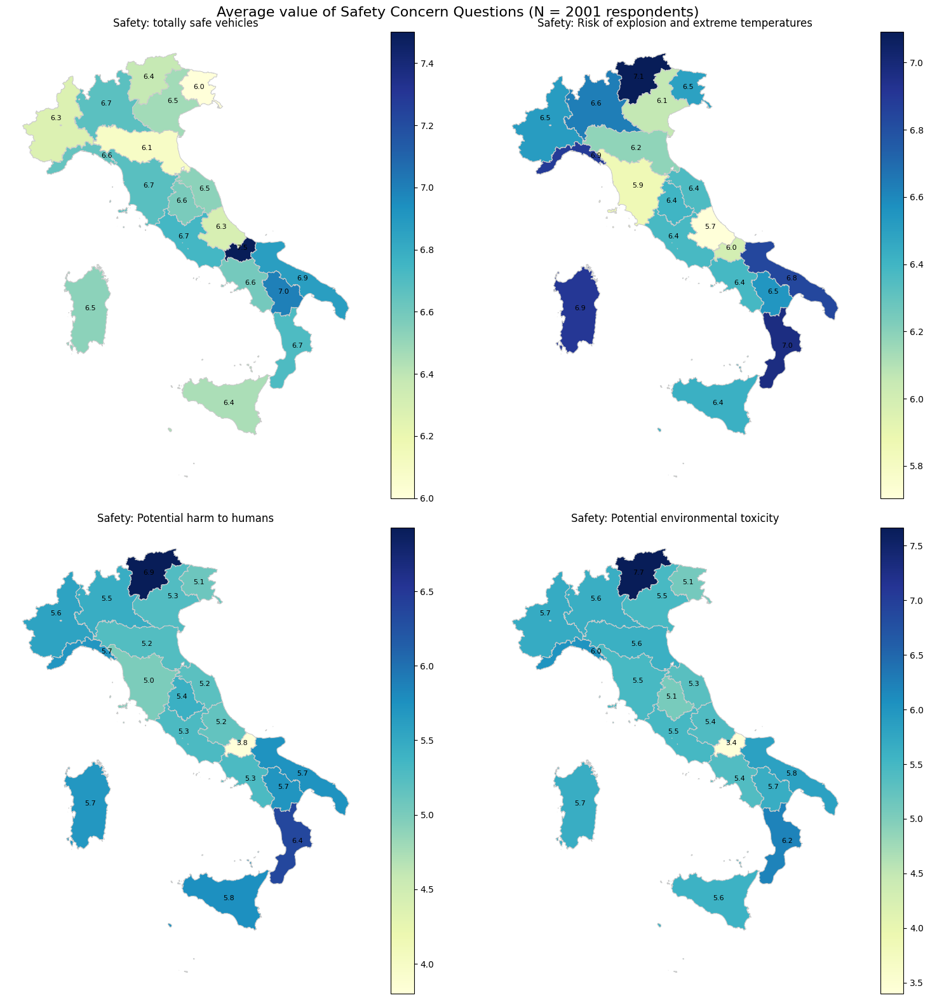

In [283]:
# Compute regional averages
region_scores = df_sc.groupby("regione_norm")[["SC_1", "SC_2", "SC_3", "SC_4"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
sc_columns = ["SC_1", "SC_2", "SC_3", "SC_4"]


for ax, col, title in zip(axes.flatten(), sc_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of Safety Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

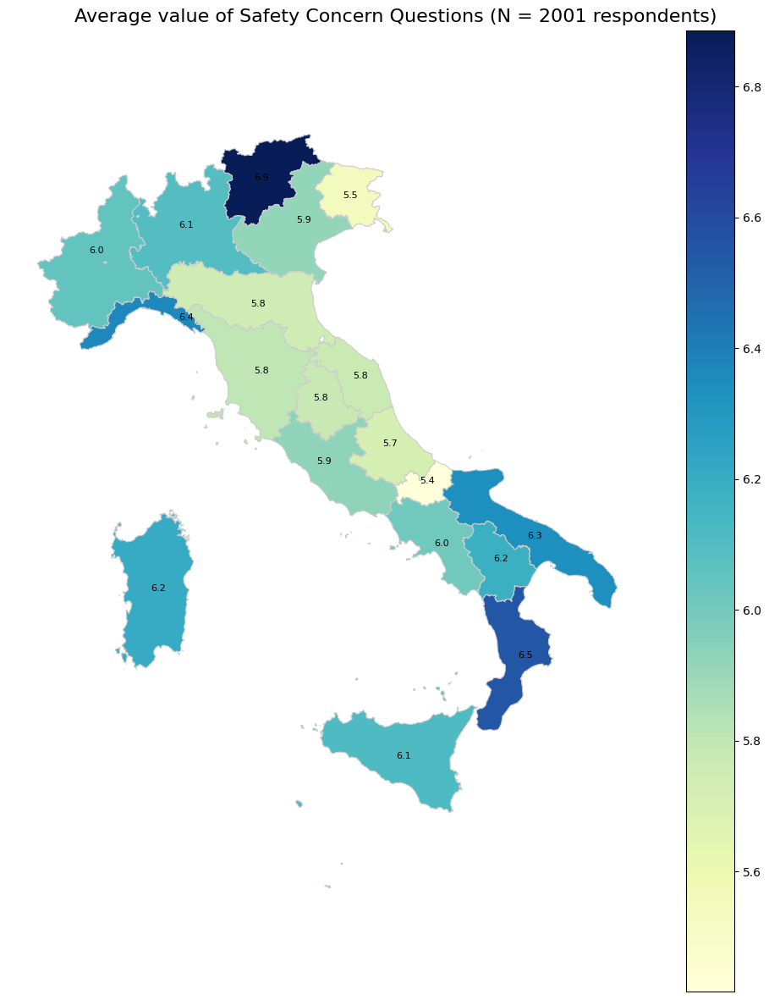

In [287]:
# Compute row-wise average of CE scores
df_sc["SC_avg"] = df_sc[sc_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_sc.groupby("regione_norm")["SC_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="SC_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['SC_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of Safety Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

### 3.2.4. General Concern

In [206]:
gc_columns = ["GC_1", "GC_2", "GC_3"]
df_gc = df.copy()

# Calculate number of respondents after filtering out "Non so"
n_respondents = len(df_gc)
n_respondents

2001

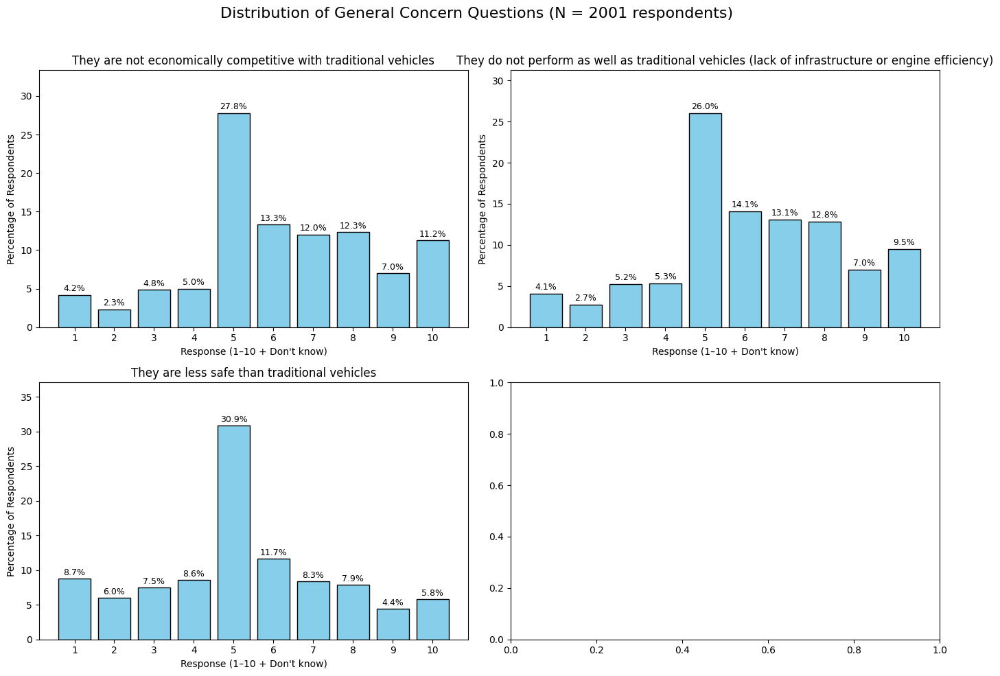

In [288]:
# Re-run the corrected plotting block
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(gc_columns):
    ax = axes[i]

    # Value counts including "Don't know"
    raw_counts = df_gc[col].replace("Non so", "Don't know").value_counts(dropna=False)
    raw_counts.index = raw_counts.index.astype(str)

    # Normalize to percentage
    total = raw_counts.sum()
    percentages = raw_counts / total * 100

    # Define plot order
    numeric_labels = [str(i) for i in range(1, 11)]
    plot_order = numeric_labels + (["Don't know"] if "Don't know" in percentages.index else [])

    # Bar values
    bar_values = [percentages.get(k, 0) for k in plot_order]
    bars = ax.bar(plot_order, bar_values, color="skyblue", edgecolor="black")

    # Annotate bars
    for bar, val in zip(bars, bar_values):
        if val > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{val:.1f}%", ha='center', fontsize=9)

    # Labels and titles
    ax.set_title(column_dict.get(col, col), fontsize=12)
    ax.set_xlabel("Response (1–10 + Don't know)")
    ax.set_ylabel("Percentage of Respondents")
    ax.set_ylim(0, max(bar_values) * 1.2 if max(bar_values) > 0 else 1)


# Add global title with number of respondents
plt.suptitle(f"Distribution of General Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [294]:
gc_columns = ["GC_1", "GC_2", "GC_3"]
df_gc = df.copy()

# Replace "Non so" with NaN for averaging
for col in gc_columns:
    df_gc[col] = pd.to_numeric(df_gc[col].replace("Non so", pd.NA), errors="coerce")


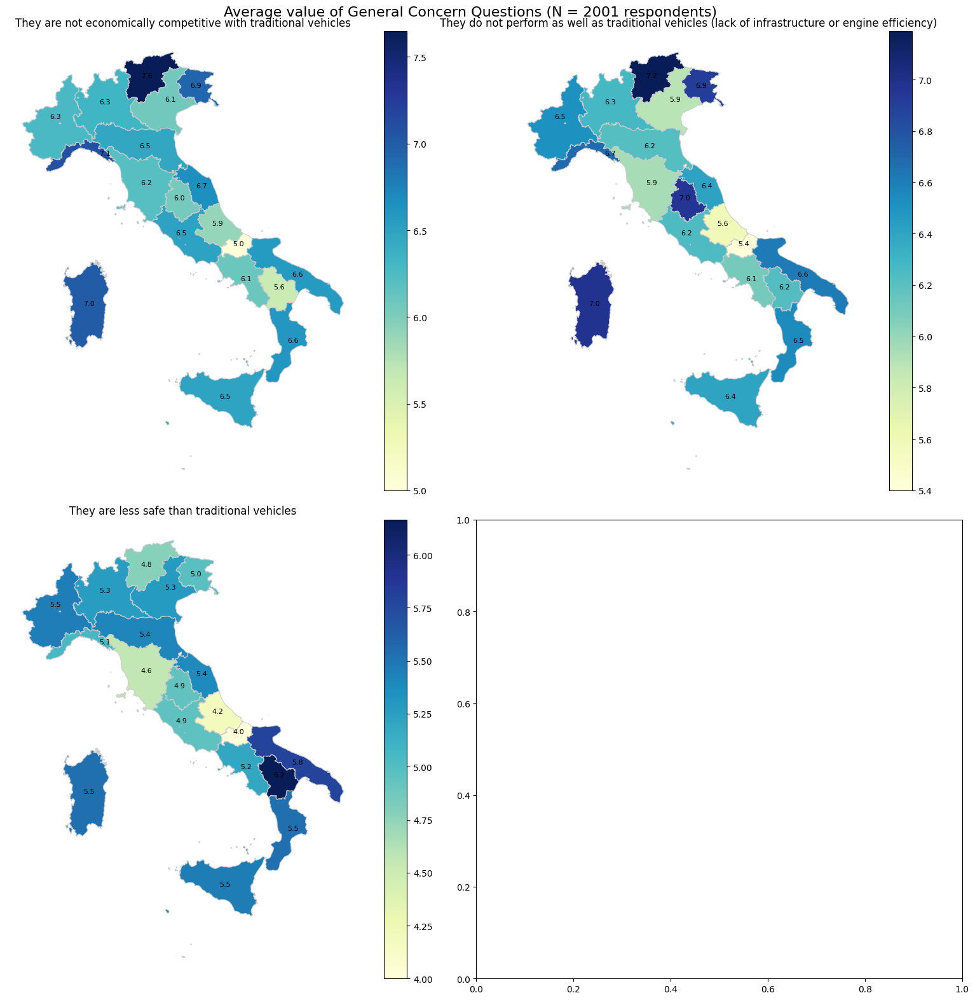

In [292]:
# Compute regional averages
region_scores = df_gc.groupby("regione_norm")[["GC_1", "GC_2", "GC_3"]].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plotting in 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
gc_columns = ["GC_1", "GC_2", "GC_3"]

for ax, col, title in zip(axes.flatten(), gc_columns, titles):
    merged.plot(column=col, cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)
    for _, row in merged.iterrows():
        centroid = row.geometry.representative_point()
        ax.text(centroid.x, centroid.y, f"{row[col]:.1f}", ha='center', fontsize=8, color='black')
#   ax.set_title(f"{title} (Avg. CT - {col})", fontsize=14)
    ax.set_title(f"{column_dict.get(col, col)}", fontsize=12)
    ax.axis("off")

plt.suptitle(f"Average value of General Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
plt.show()

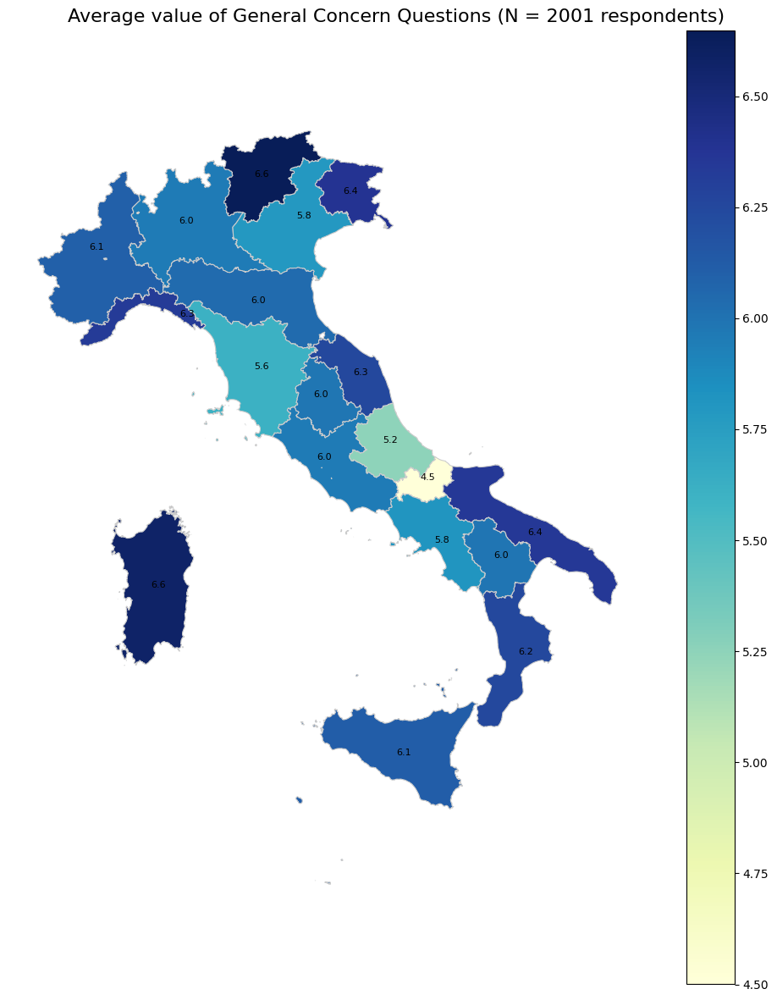

In [295]:
# Compute row-wise average of CE scores
df_gc["GC_avg"] = df_gc[gc_columns].mean(axis=1, skipna=True)

# Compute regional average
region_scores = df_gc.groupby("regione_norm")["GC_avg"].mean().reset_index()

# Merge with GeoDataFrame
merged = gdf.merge(region_scores, left_on="reg_name_norm", right_on="regione_norm")

# Plot map
fig, ax = plt.subplots(1, 1, figsize=(10, 12))
merged.plot(column="GC_avg", cmap="YlGnBu", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

# Add labels
for _, row in merged.iterrows():
    centroid = row.geometry.representative_point()
    ax.text(centroid.x, centroid.y, f"{row['GC_avg']:.1f}", ha='center', fontsize=8, color='black')

plt.suptitle(f"Average value of General Concern Questions (N = {n_respondents} respondents)", fontsize=16)
plt.tight_layout()
ax.axis("off")
plt.show()

# 4. Attitudini e Willingness to Pay